In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import os
import warnings
from matplotlib import font_manager, rc
warnings.filterwarnings("ignore")
plt.style.use('ggplot')
rc('font', family='HCR Dotum')
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

In [148]:
data = pd.read_csv('상권2.csv', thousands=',', encoding='euc-kr').drop(['Unnamed: 0'], axis=1)

In [149]:
data.head()

,년도,분기,행정구역,개업률,폐업률,5 생존률,임대료,최근 10년 평균영업기간,프랜차이즈 점포 비율,직장 인구 대비 주거 인구,target
0,2016,3,종로구,3.9,4.3,31.3,142788,3.1,0.135158,2.016129,정체
1,2016,3,중구,3.5,3.9,37.4,188434,3.2,0.161454,4.700000,정체
2,2016,3,용산구,4.6,4.6,32.1,100920,3.0,0.129965,0.742268,정체
3,2016,3,성동구,5.2,5.2,32.3,85570,3.0,0.177305,0.673333,정체
4,2016,3,광진구,4.4,5.1,25.4,88334,3.0,0.186925,0.228426,다이나믹


In [150]:
## 지역구 변수 생성
region = list(set(x1.region))
region.sort()
region

['강남구',
 '강동구',
 '강북구',
 '강서구',
 '관악구',
 '광진구',
 '구로구',
 '금천구',
 '노원구',
 '도봉구',
 '동대문구',
 '동작구',
 '마포구',
 '서대문구',
 '서초구',
 '성동구',
 '성북구',
 '송파구',
 '양천구',
 '영등포구',
 '용산구',
 '은평구',
 '종로구',
 '중구',
 '중랑구']

In [151]:
date = []
date = ["2016-3","2016-4"]
for i in range(17,21):
    for j in range(1,5):
        date.append(str("20"+str(i)+"-"+str(j)))
date.append("2021-1")
date.append("2021-2")
date

['2016-3',
 '2016-4',
 '2017-1',
 '2017-2',
 '2017-3',
 '2017-4',
 '2018-1',
 '2018-2',
 '2018-3',
 '2018-4',
 '2019-1',
 '2019-2',
 '2019-3',
 '2019-4',
 '2020-1',
 '2020-2',
 '2020-3',
 '2020-4',
 '2021-1',
 '2021-2']

# 변수 1 : 개업률

In [152]:
x1 = data.loc[:,["년도","분기","행정구역","개업률"]]
x1.columns = ["year","period","region","open"]
x1["date"] = 0

for i in range(0,len(x1)):
    x1["date"][i] = str(x1.loc[:,"year"][i])+str("-")+str(x1.loc[:,'period'][i])
x1

,year,period,region,open,date
0,2016,3,종로구,3.9,2016-3
1,2016,3,중구,3.5,2016-3
2,2016,3,용산구,4.6,2016-3
3,2016,3,성동구,5.2,2016-3
4,2016,3,광진구,4.4,2016-3
...,...,...,...,...,...
495,2021,2,관악구,5.3,2021-2
496,2021,2,서초구,3.6,2021-2
497,2021,2,강남구,4.8,2021-2
498,2021,2,송파구,4.6,2021-2


## 개업률 시계열도

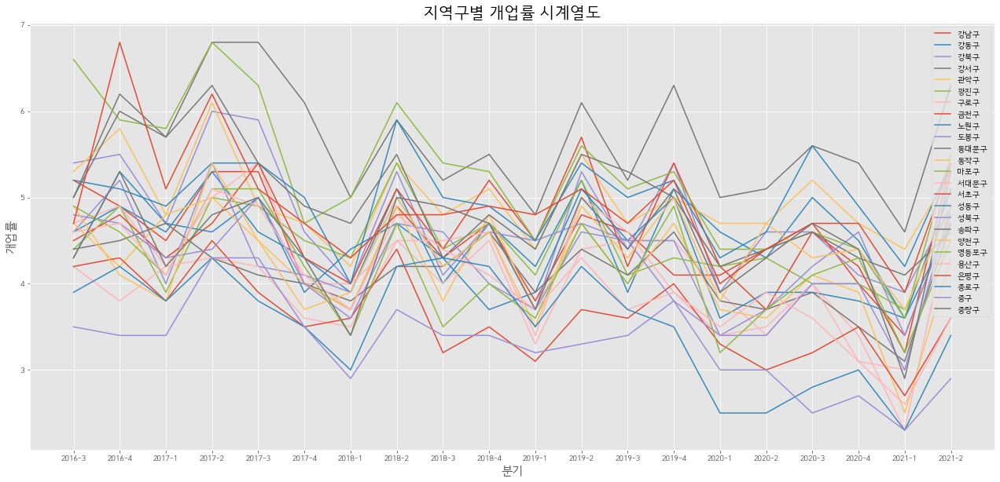

In [153]:
plt.figure(figsize=(22,10))
plt.title("지역구별 개업률 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("개업률",fontsize=15)
for i in range(0,25):
    plt.plot(date, x1.open[x1.region == region[i]],label=region[i])
    plt.legend()

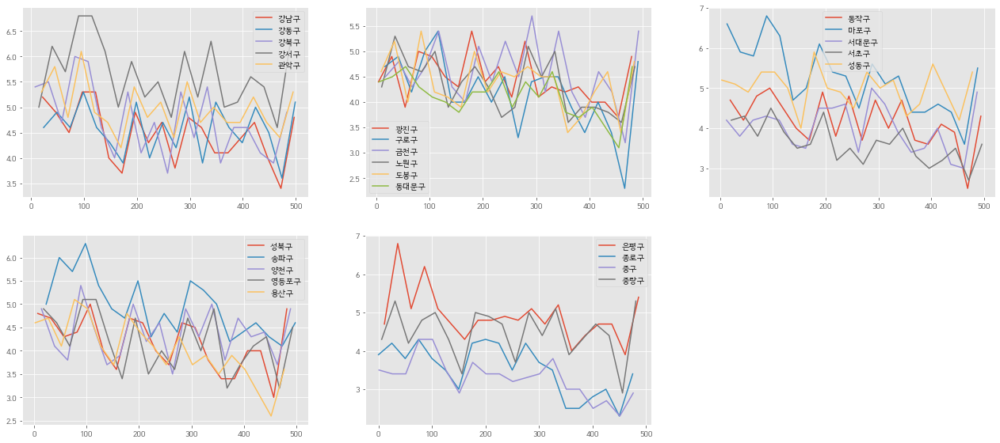

In [154]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x1.open[x1.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x1.open[x1.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x1.open[x1.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x1.open[x1.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x1.open[x1.region == region[i]],label=region[i])
    plt.legend()


- 분기별 추세가 있어보임. -> 다중회귀모형으로 분기별 추세 파악.

In [155]:
## 더미변수 생성
## 분기 더미변수
dummy = pd.get_dummies(x1.loc[:,"period"])
dummy2 = pd.get_dummies(x1.loc[:,"year"])

## 2021년 3,4분기 예측

In [ ]:
dat_open = pd.concat([data['행정구역'], dummy], axis=1)
dat_open = pd.concat([dat_open, dummy2], axis=1)
dat_open = pd.concat([dat_open, x1.open], axis=1)
dat_open

In [251]:
predict = np.array([])

for i in range(0, 25):
    df_open = dat_open[dat_open['행정구역'] == region[i]]
    x = np.array(df_open.iloc[:,1:11])
    y = np.array(df_open.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict = np.append(predict, lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_open = dat[dat['행정구역'] == region[i]]
    x = np.array(df_open.iloc[:,1:11])
    y = np.array(df_open.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict = np.append(predict,lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [259]:
predict

array([4.365 , 4.0725, 4.4475, 5.4925, 4.7225, 4.0525, 3.88  , 4.4075,
       4.08  , 4.0075, 3.875 , 3.3125, 4.6025, 4.2875, 2.955 , 5.16  ,
       4.415 , 4.0475, 4.34  , 4.01  , 3.0675, 4.4325, 2.96  , 2.655 ,
       4.45  , 2.7425, 3.5075, 3.9825, 3.8925, 3.4275, 2.5475, 3.305 ,
       3.2125, 3.5275, 2.965 , 2.8375, 3.215 , 3.3825, 3.155 , 2.58  ,
       2.9375, 3.17  , 3.1825, 2.97  , 3.1925, 2.8475, 3.3725, 2.8025,
       2.8825, 3.635 ])

## 모형 잔차 검정

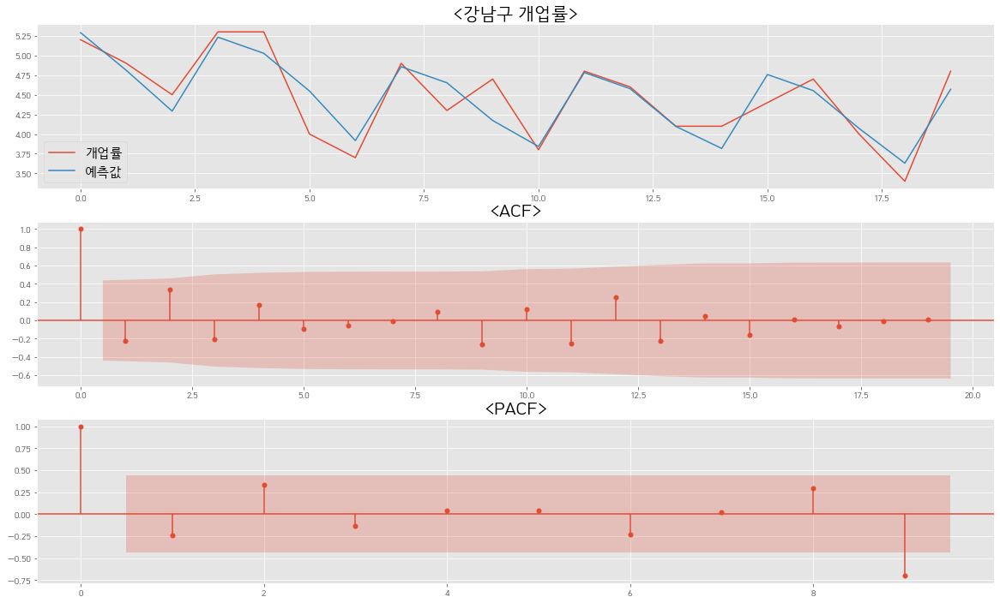

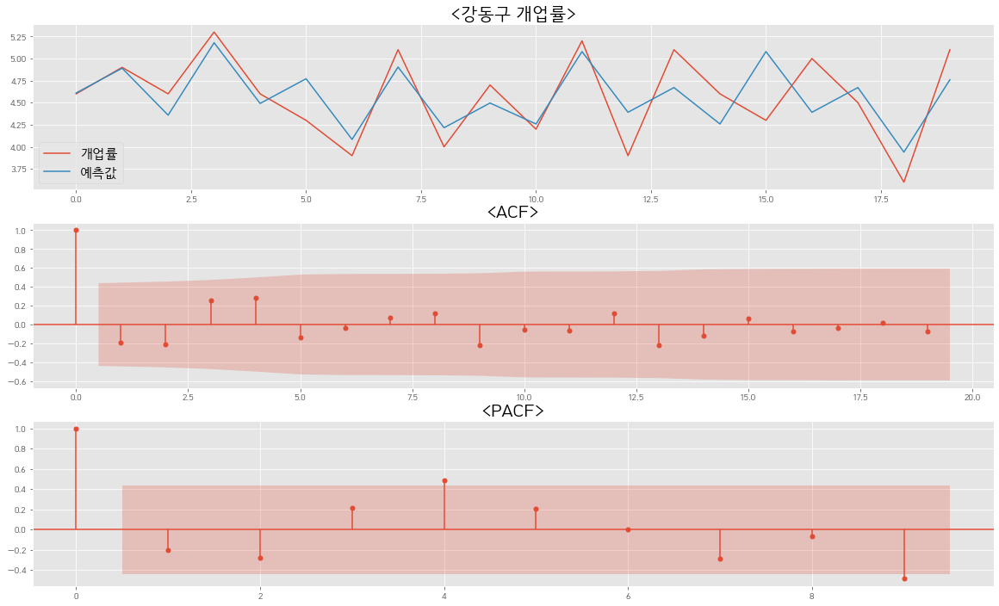

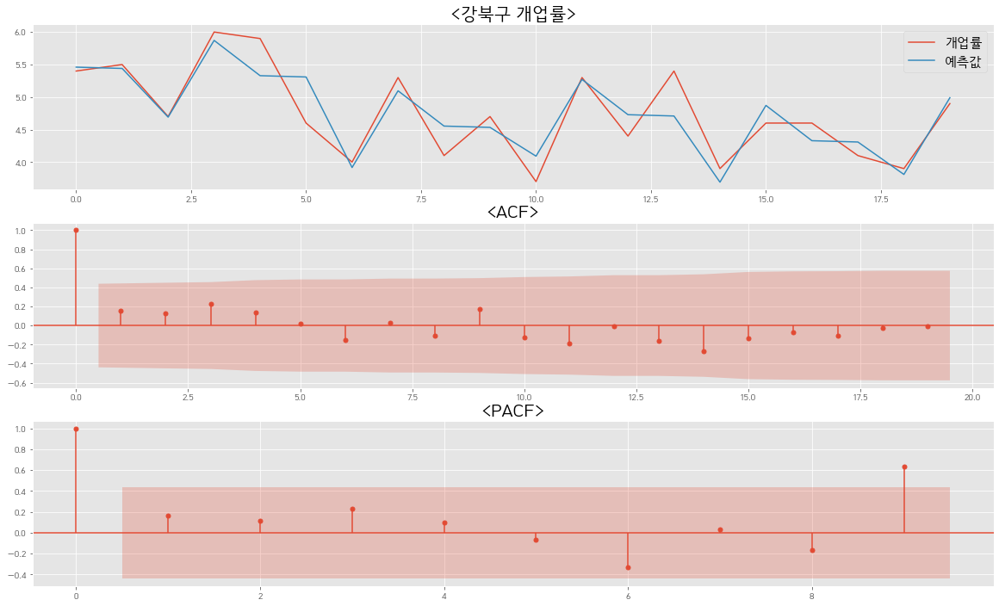

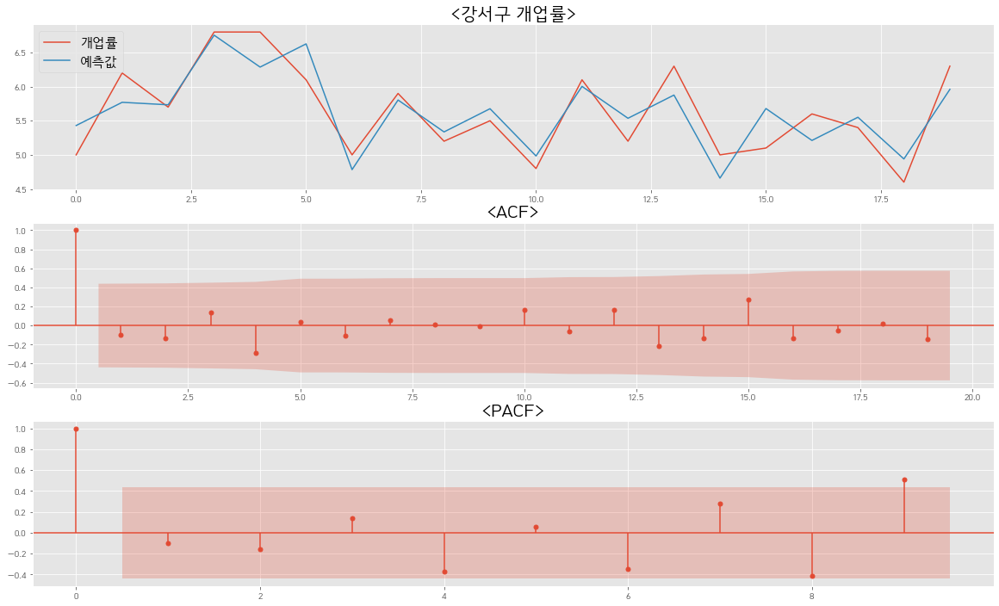

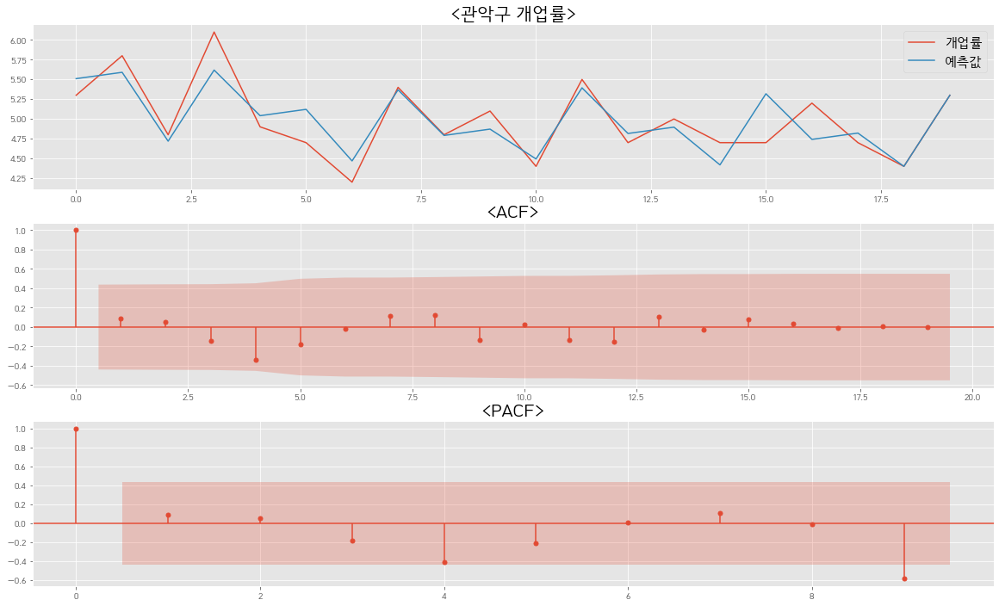

...

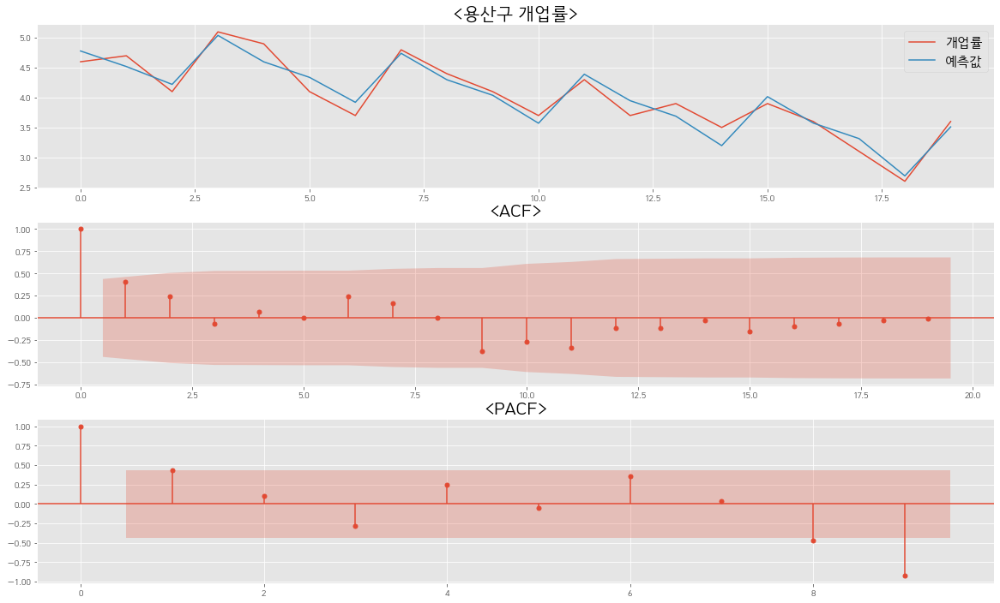

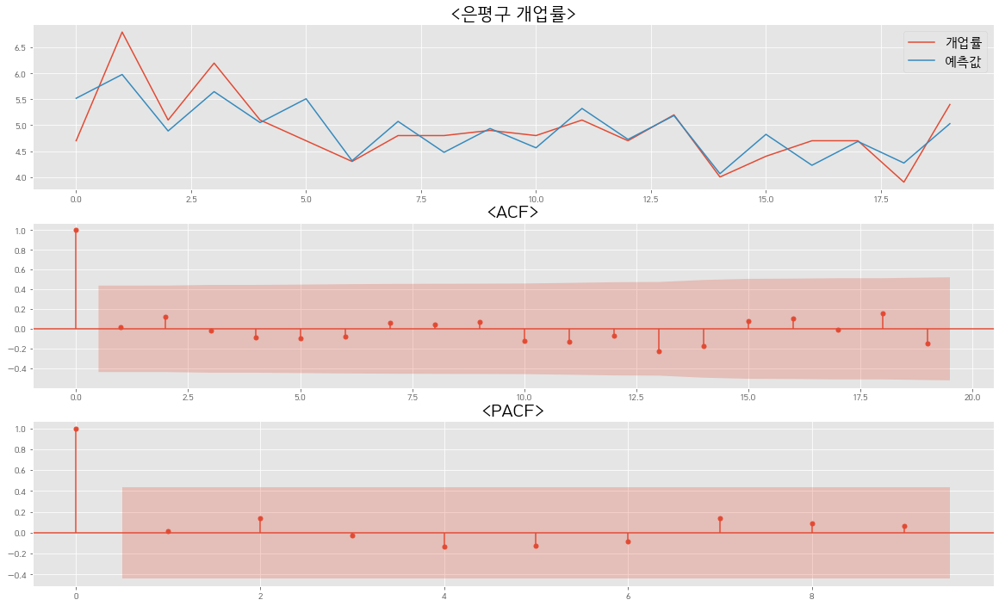

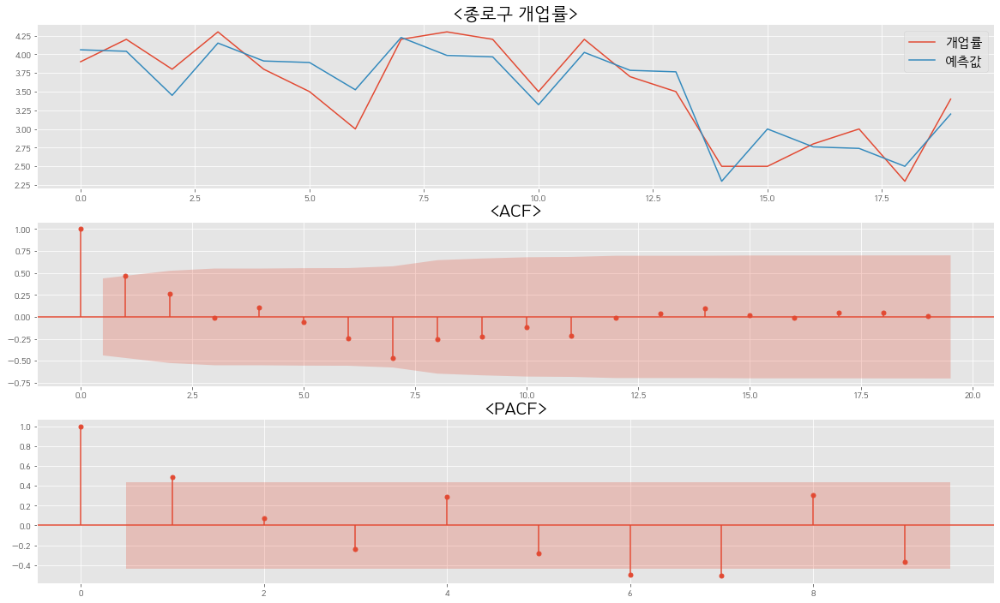

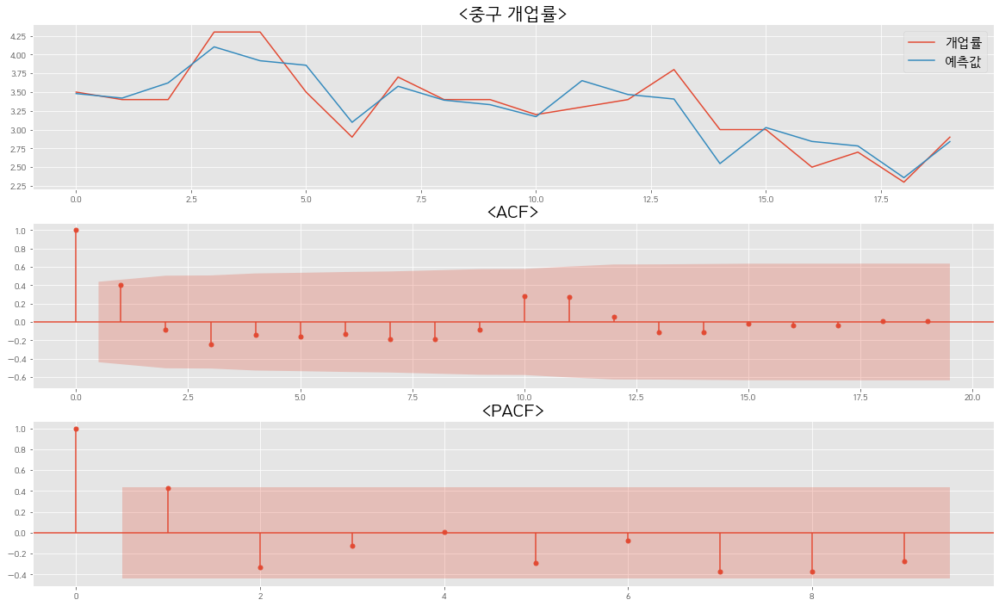

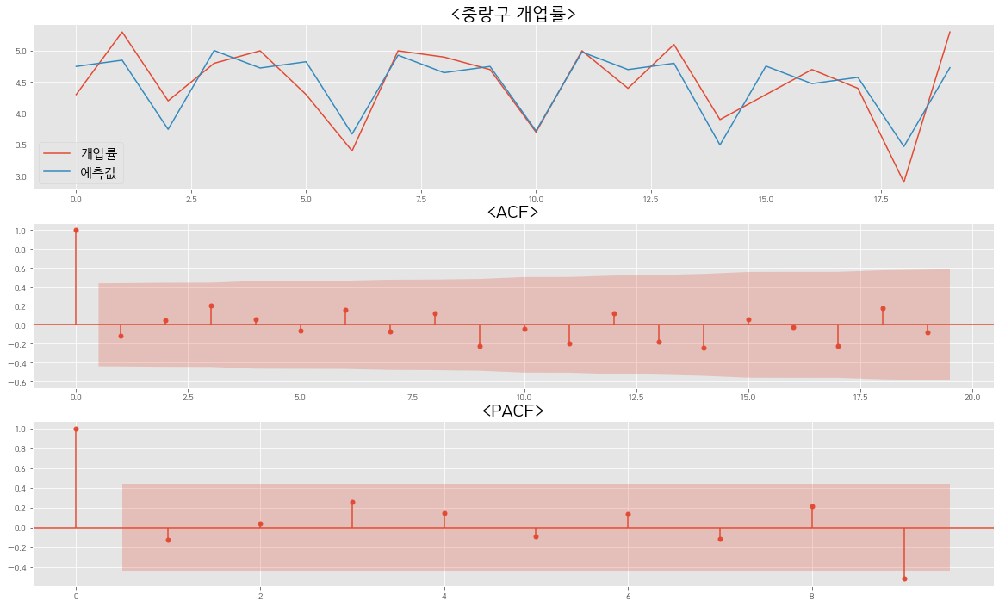

In [253]:
for i in range(0,25):
    df_open = dat_open[dat_open['행정구역'] == region[i]]
    x = np.array(df_open.iloc[:,1:-1])
    y = np.array(df_open.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ## 예측
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='개업률')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 개업률>",fontsize=20)
    plt.legend(fontsize=15)
    
    ## 잔차 검정
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

----

# 변수 2 : 폐업률

In [160]:
x2 = data.loc[:,["년도","분기","행정구역","폐업률"]]
x2.columns = ["year","period","region","close"]
x2["date"] = 0

for i in range(0,len(x1)):
    x2["date"][i] = str(x2.loc[:,"year"][i])+str("-")+str(x2.loc[:,'period'][i])
x2

,year,period,region,close,date
0,2016,3,종로구,4.3,2016-3
1,2016,3,중구,3.9,2016-3
2,2016,3,용산구,4.6,2016-3
3,2016,3,성동구,5.2,2016-3
4,2016,3,광진구,5.1,2016-3
...,...,...,...,...,...
495,2021,2,관악구,4.7,2021-2
496,2021,2,서초구,3.2,2021-2
497,2021,2,강남구,3.5,2021-2
498,2021,2,송파구,4.0,2021-2


## 폐업률 시계열도

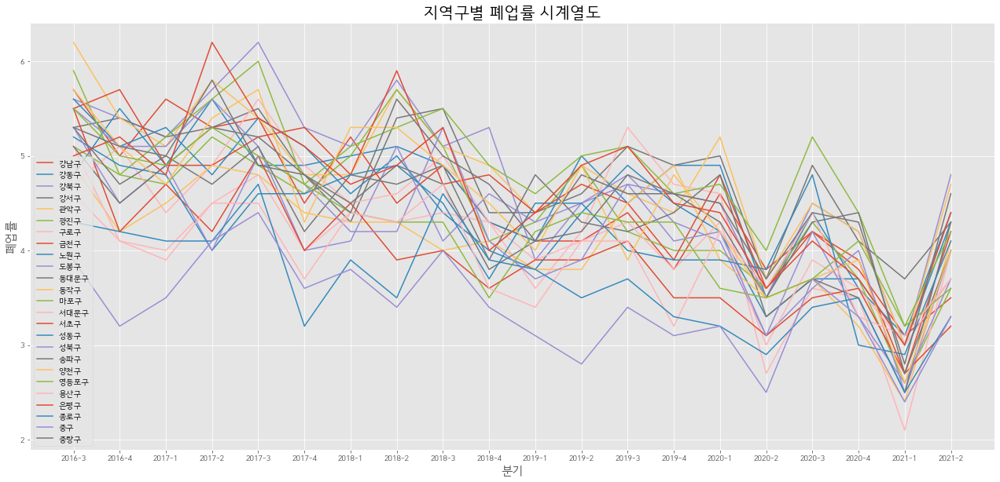

In [161]:
plt.figure(figsize=(22,10))
plt.title("지역구별 폐업률 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("폐업률",fontsize=15)
for i in range(0,25):
    plt.plot(date, x2.close[x2.region == region[i]],label=region[i])
    plt.legend()

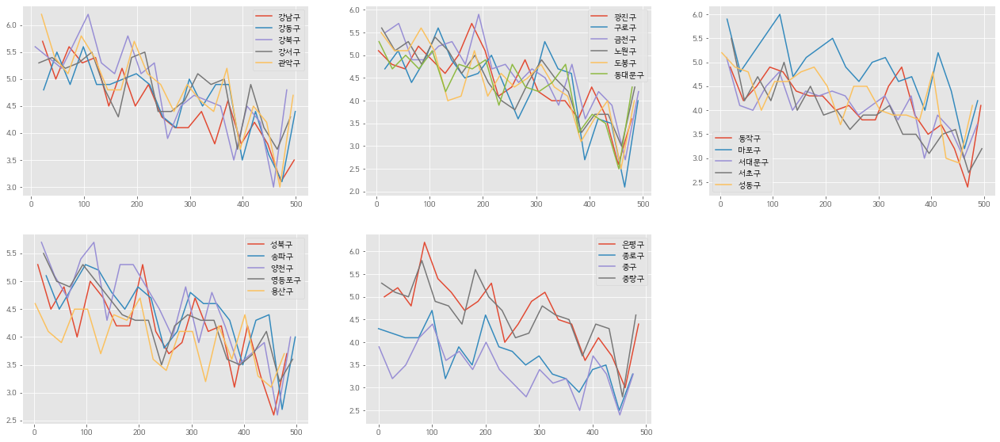

In [162]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x2.close[x2.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x2.close[x2.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x2.close[x2.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x2.close[x2.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x2.close[x2.region == region[i]],label=region[i])
    plt.legend()


- 지역구별 분기별 추세가 있어보임 -> 다중회귀모형으로 분기별 추세 파악

## 2021년 3,4분기 예측

In [ ]:
dat_close = pd.concat([data['행정구역'], dummy], axis=1)
dat_close = pd.concat([dat_close, dummy2], axis=1)
dat_close = pd.concat([dat_close, x2.close], axis=1)
dat_close

In [263]:
predict2 = np.array([])

for i in range(0, 25):
    df_close = dat_close[dat_close['행정구역'] == region[i]]
    x = np.array(df_close.iloc[:,1:11])
    y = np.array(df_close.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict2 = np.append(predict2, lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_close = dat_close[dat_close['행정구역'] == region[i]]
    x = np.array(df_close.iloc[:,1:11])
    y = np.array(df_close.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict2 = np.append(predict2, lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [264]:
predict2

array([3.3825, 3.5675, 4.2425, 4.4325, 3.8475, 3.0275, 3.645 , 3.3125,
       3.8475, 3.185 , 3.3375, 3.435 , 4.2425, 3.695 , 3.22  , 3.5375,
       3.93  , 3.5425, 3.23  , 3.4325, 3.7275, 3.8525, 3.3225, 3.4425,
       3.815 , 2.7425, 3.5075, 3.9825, 3.8925, 3.4275, 2.5475, 3.305 ,
       3.2125, 3.5275, 2.965 , 2.8375, 3.215 , 3.3825, 3.155 , 2.58  ,
       2.9375, 3.17  , 3.1825, 2.97  , 3.1925, 2.8475, 3.3725, 2.8025,
       2.8825, 3.635 ])

## 모형 잔차 검정

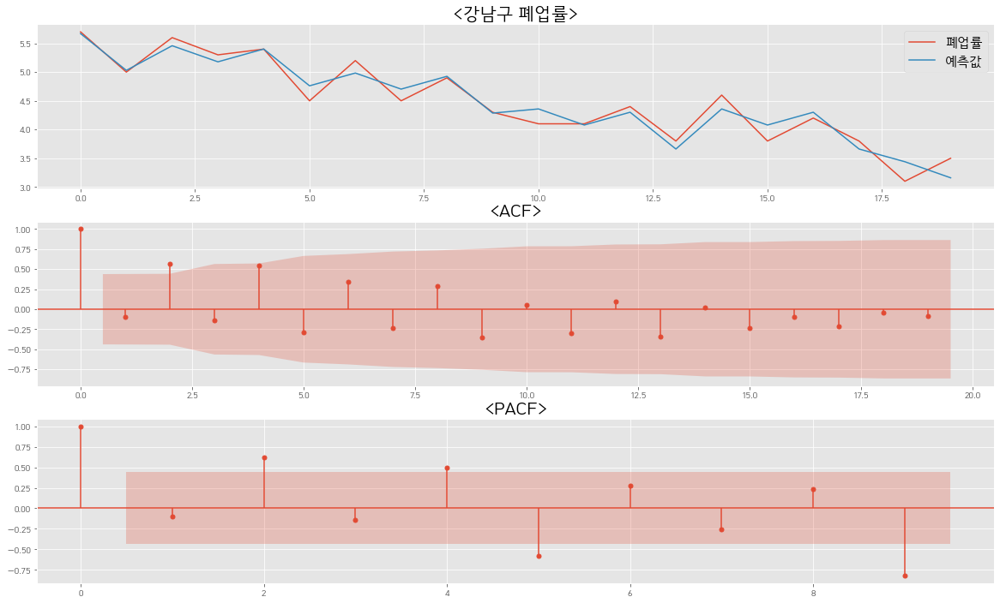

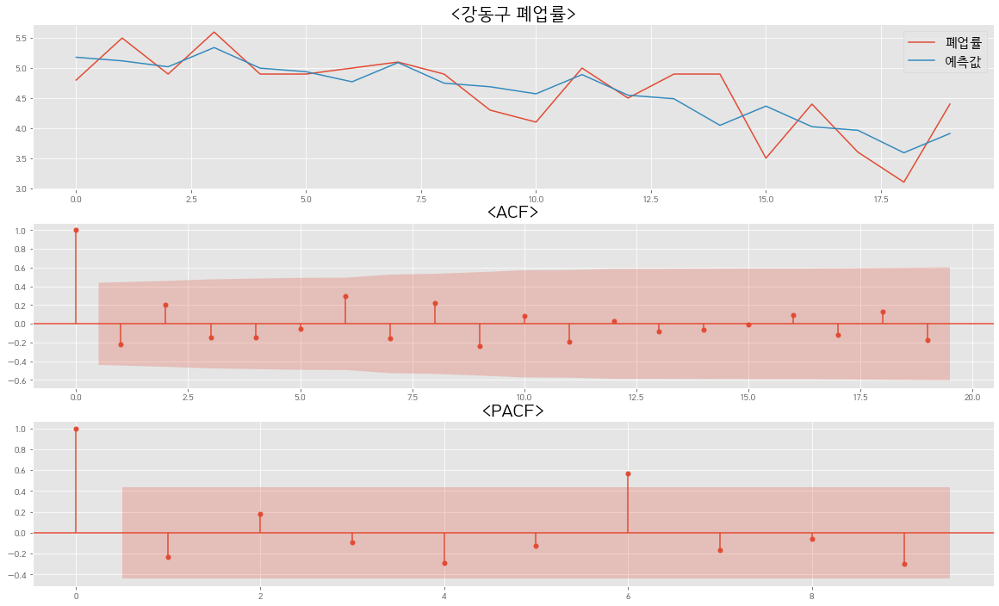

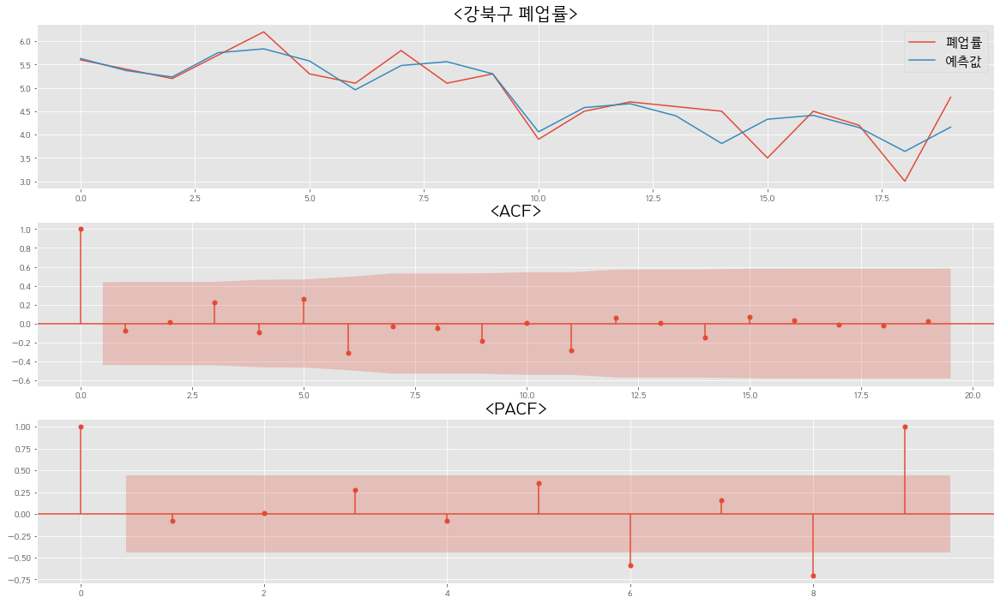

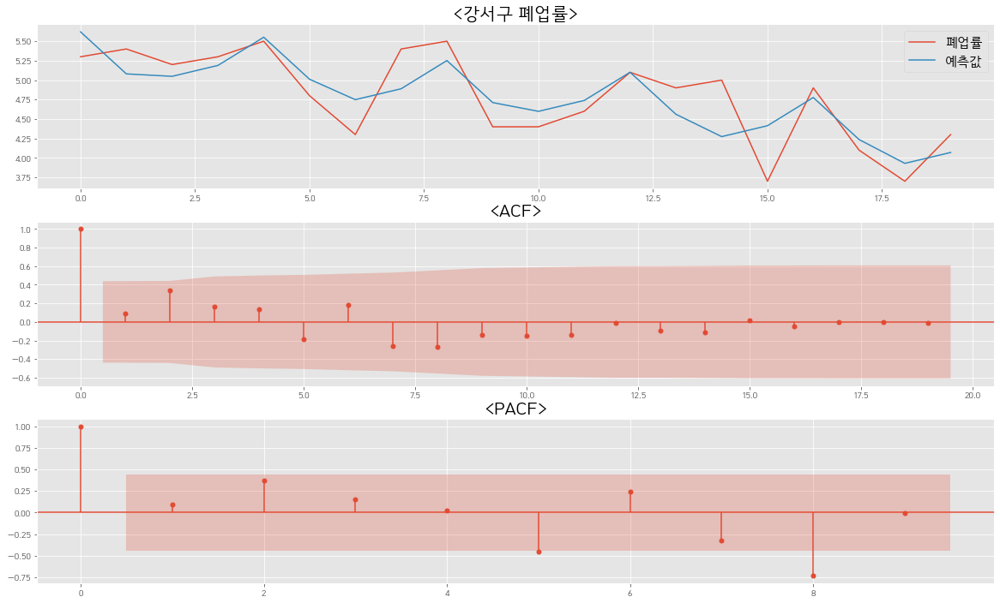

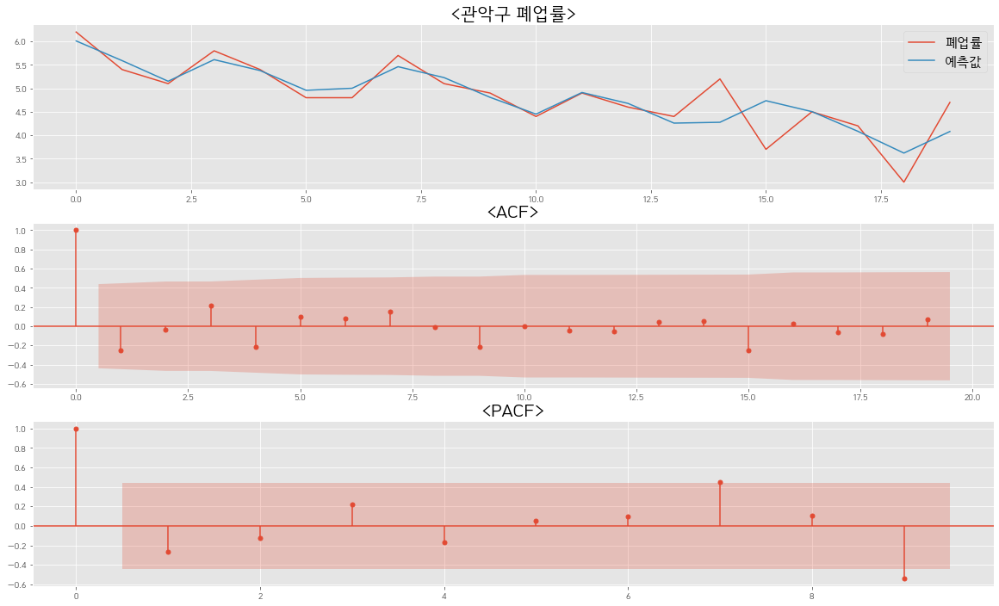

...

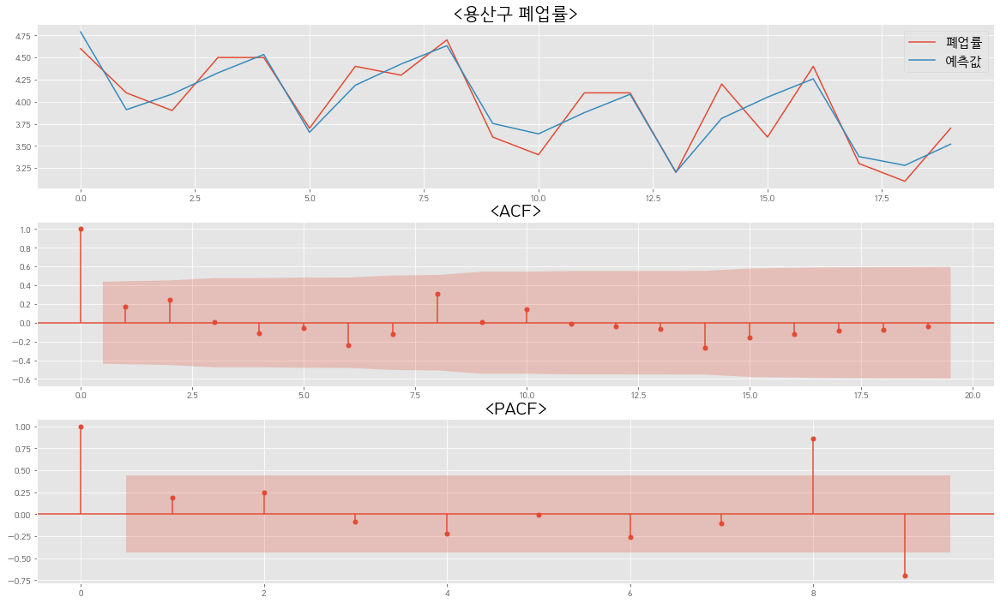

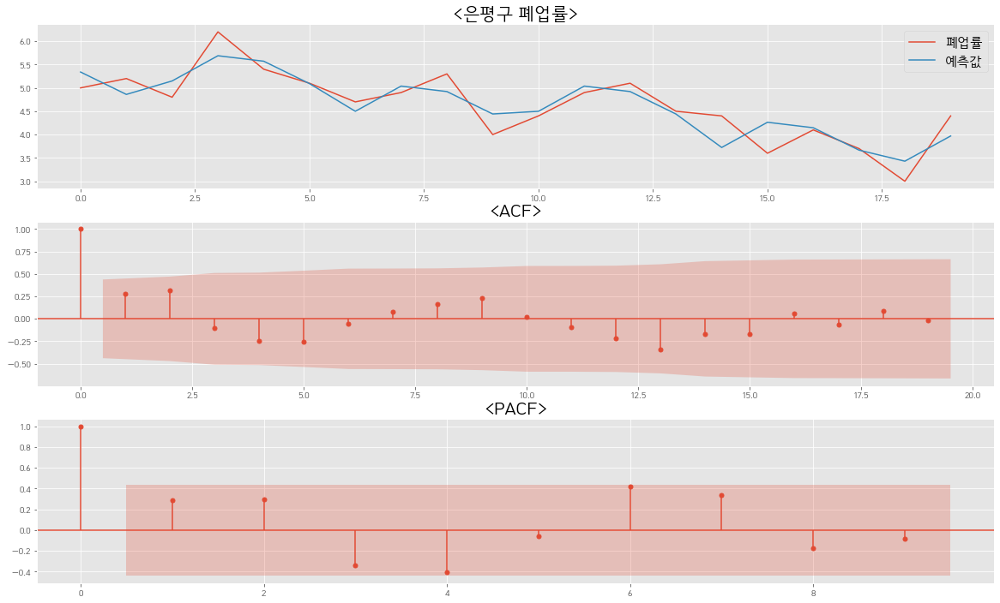

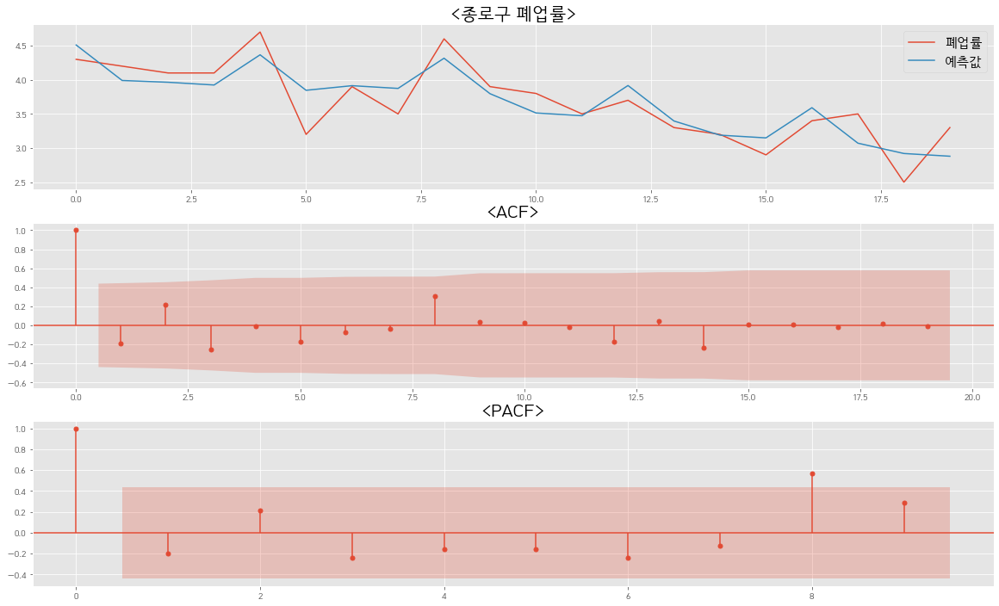

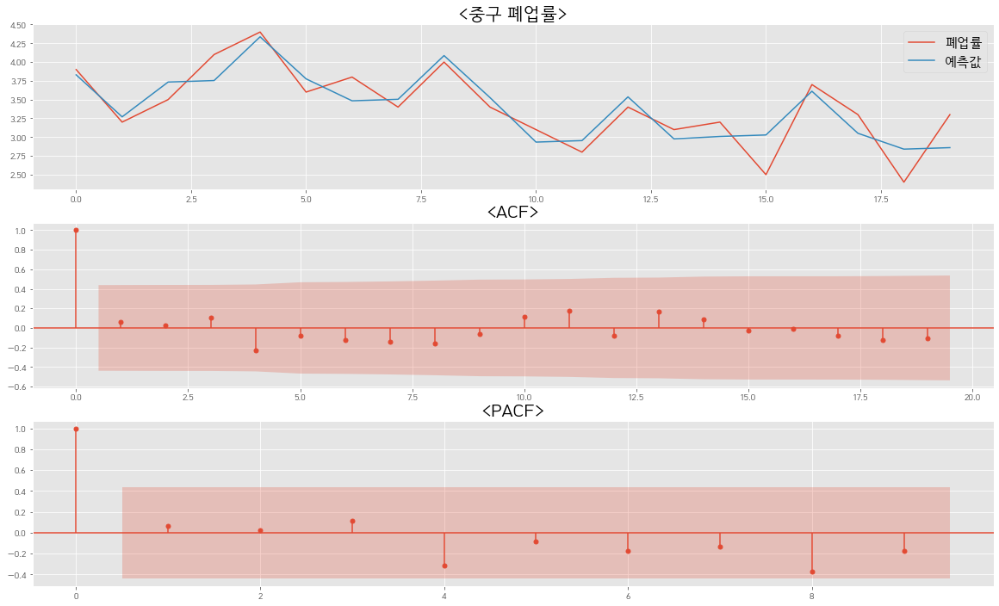

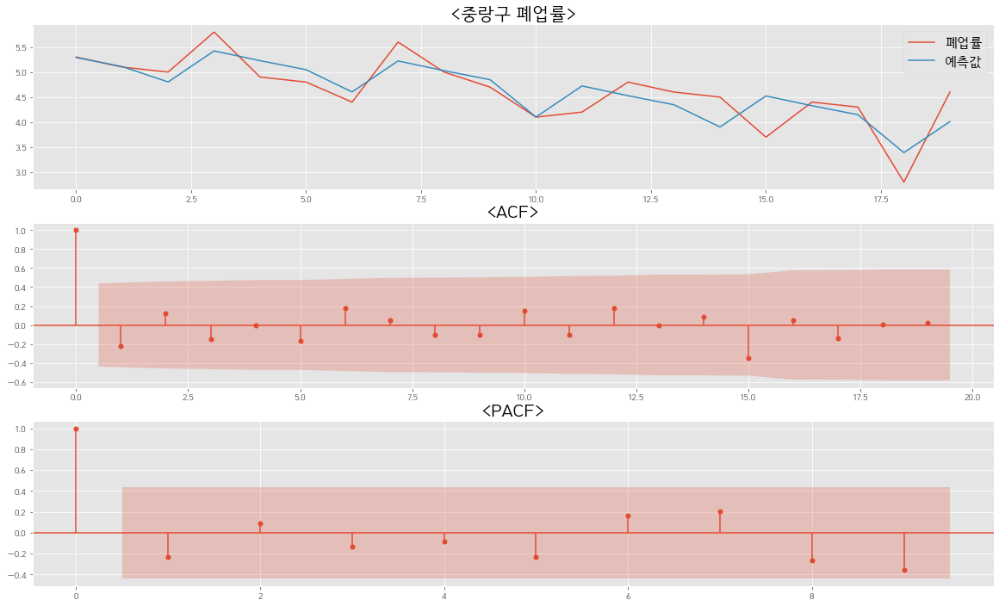

In [258]:
for i in range(0,25):
    df_close = dat_close[dat_close['행정구역'] == region[i]]
    x = np.array(df_close.iloc[:,1:-1])
    y = np.array(df_close.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='폐업률')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 폐업률>",fontsize=20)
    plt.legend(fontsize=15)
    
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

# 변수3 : 5년 생존률

In [181]:
x3 = data.iloc[:,[0,1,2,5]]
x3.columns = ["year","period","region","survive"]
x3["date"] = 0

for i in range(0,len(x1)):
    x3["date"][i] = str(x3.loc[:,"year"][i])+str("-")+str(x3.loc[:,'period'][i])
x3

,year,period,region,survive,date
0,2016,3,종로구,31.3,2016-3
1,2016,3,중구,37.4,2016-3
2,2016,3,용산구,32.1,2016-3
3,2016,3,성동구,32.3,2016-3
4,2016,3,광진구,25.4,2016-3
...,...,...,...,...,...
495,2021,2,관악구,27.4,2021-2
496,2021,2,서초구,34.0,2021-2
497,2021,2,강남구,30.1,2021-2
498,2021,2,송파구,31.7,2021-2


## 5년 생존률 시계열도

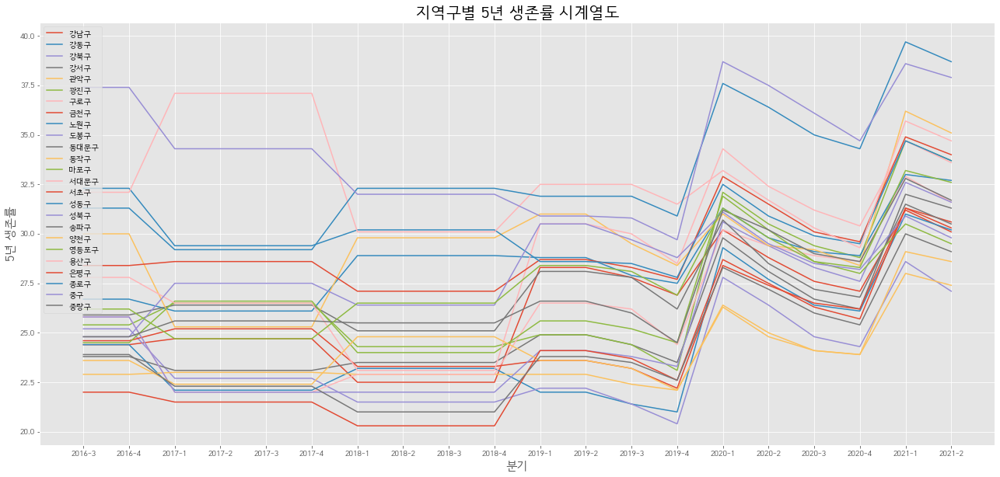

In [194]:
plt.figure(figsize=(22,10))
plt.title("지역구별 5년 생존률 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("5년 생존률",fontsize=15)
for i in range(0,25):
    plt.plot(date, x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()

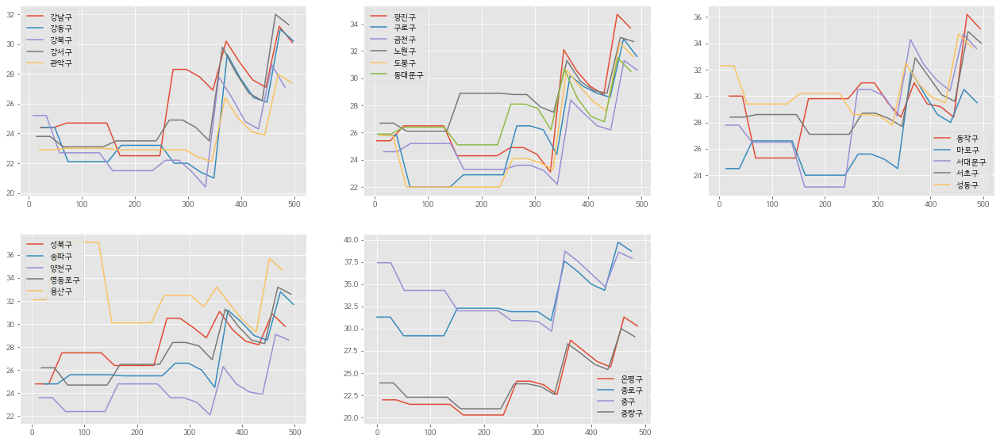

In [299]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x3.survive[x3.region == region[i]],label=region[i])
    plt.legend()


## 2021년 3,4분기 예측

In [ ]:
dat_survive = pd.concat([data['행정구역'], dummy], axis=1)
dat_survive = pd.concat([dat_survive, dummy2], axis=1)
dat_survive = pd.concat([dat_survive, x3.survive], axis=1)
dat_survive

In [268]:
predict3 = np.array([])

for i in range(0, 25):
    df_survive = dat_survive[dat_survive['행정구역'] == region[i]]
    x = np.array(df_survive.iloc[:,1:11])
    y = np.array(df_survive.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict3 = np.append(predict3, lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_survive = dat_survive[dat_survive['행정구역'] == region[i]]
    x = np.array(df1.iloc[:,1:11])
    y = np.array(df1.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict3 = np.append(predict3, lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [269]:
predict3

array([30.015 , 29.9075, 27.0375, 30.9275, 27.1625, 33.5525, 31.8975,
       30.4675, 32.2475, 31.57  , 30.275 , 34.9775, 29.255 , 33.43  ,
       33.7975, 33.6975, 29.67  , 31.6275, 28.355 , 32.3   , 34.6125,
       30.2075, 38.6575, 37.6625, 29.    ,  2.7425,  2.7425,  2.7425,
        2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,
        2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,
        2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,  2.7425,
        2.7425])

## 잔차 검정

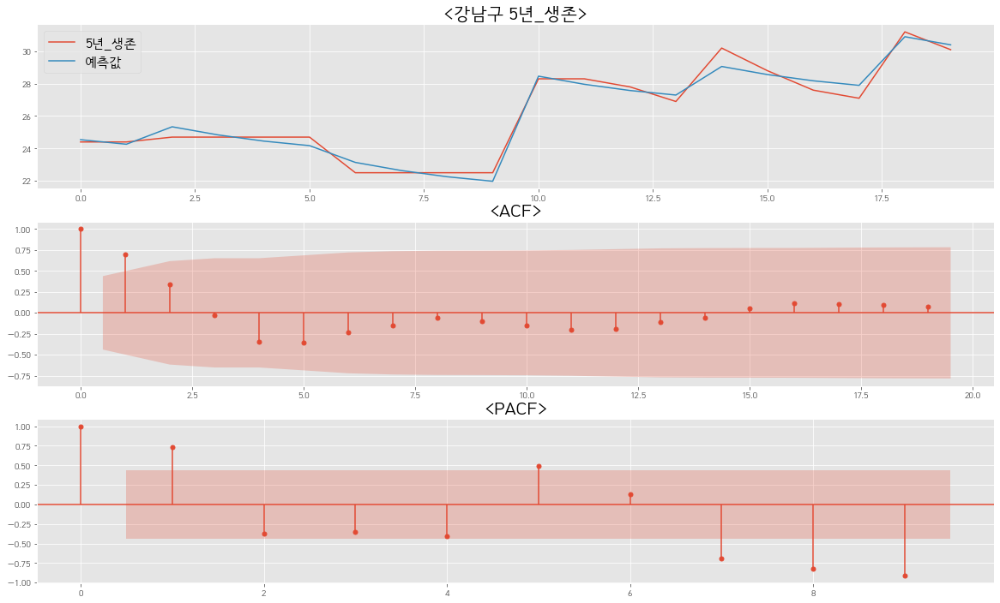

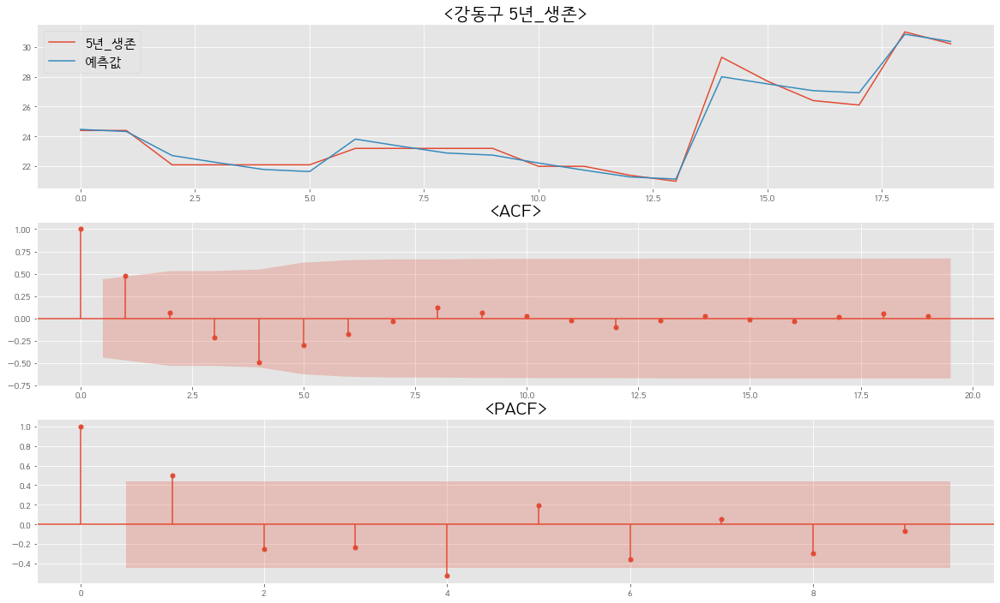

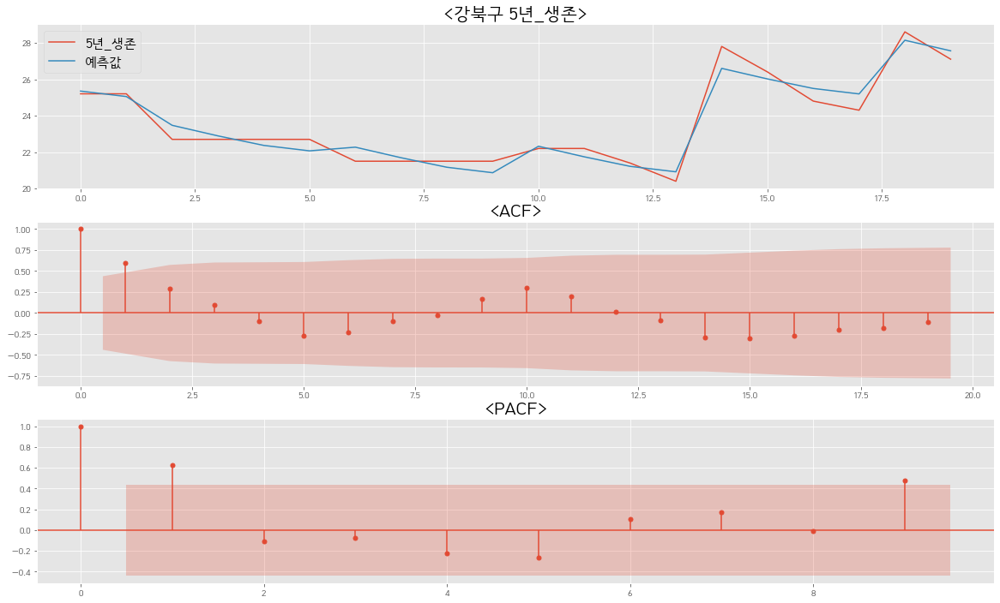

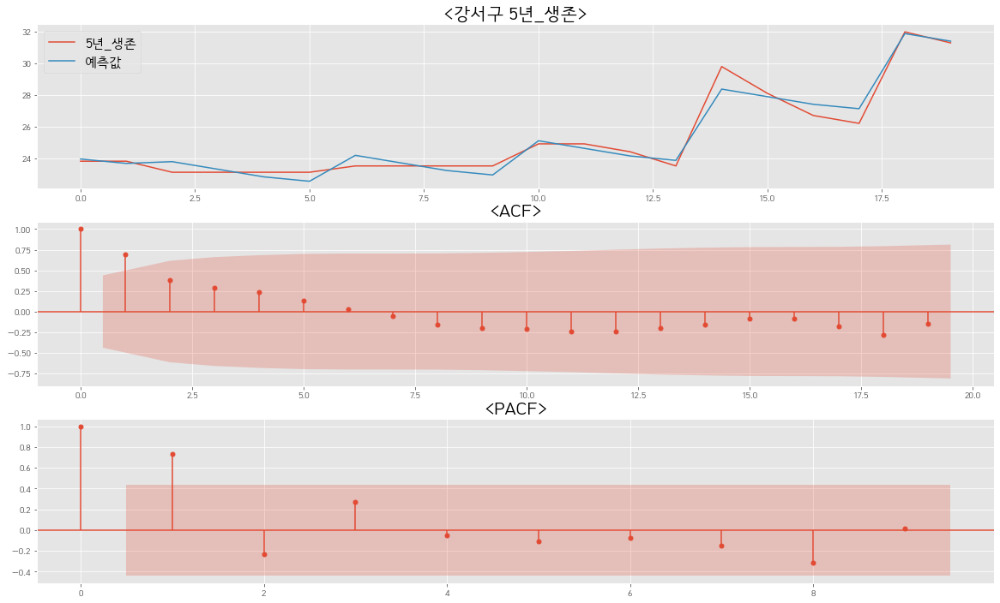

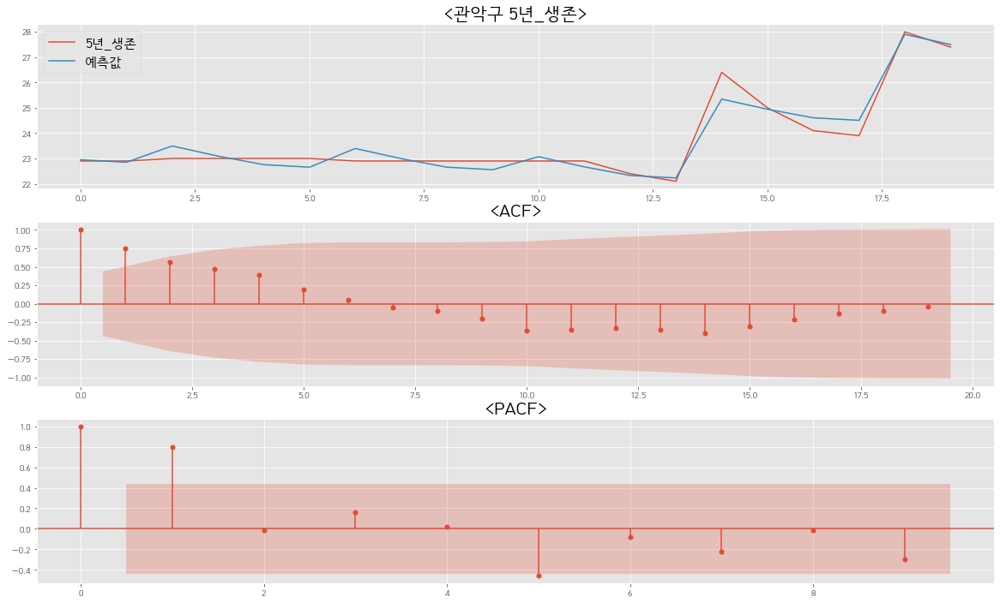

...

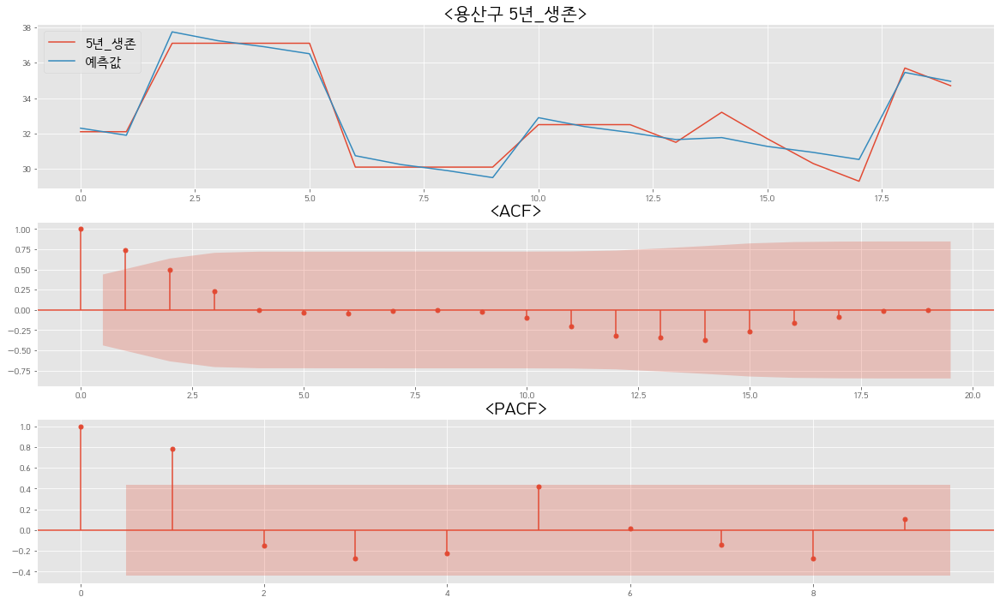

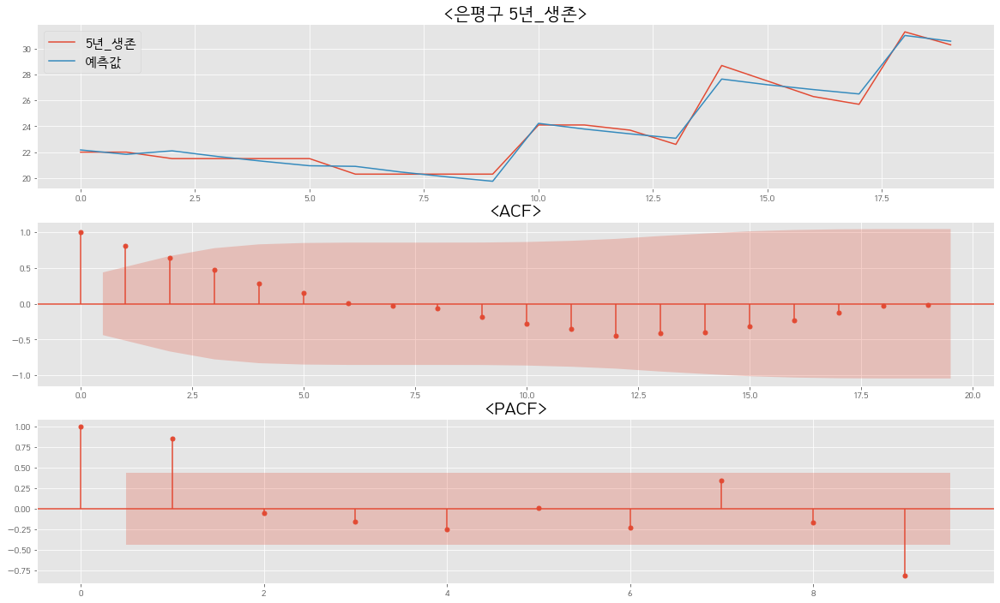

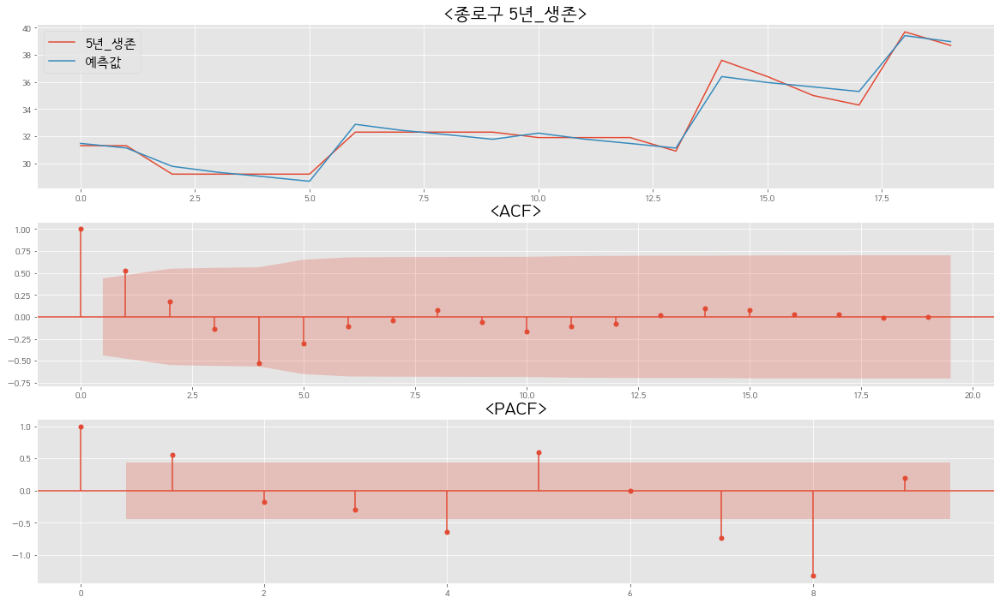

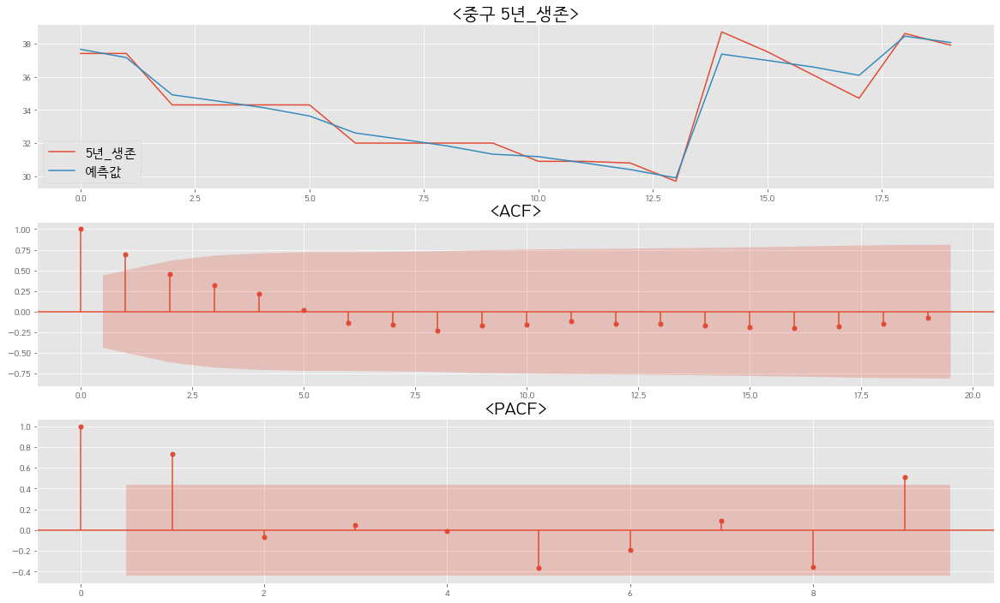

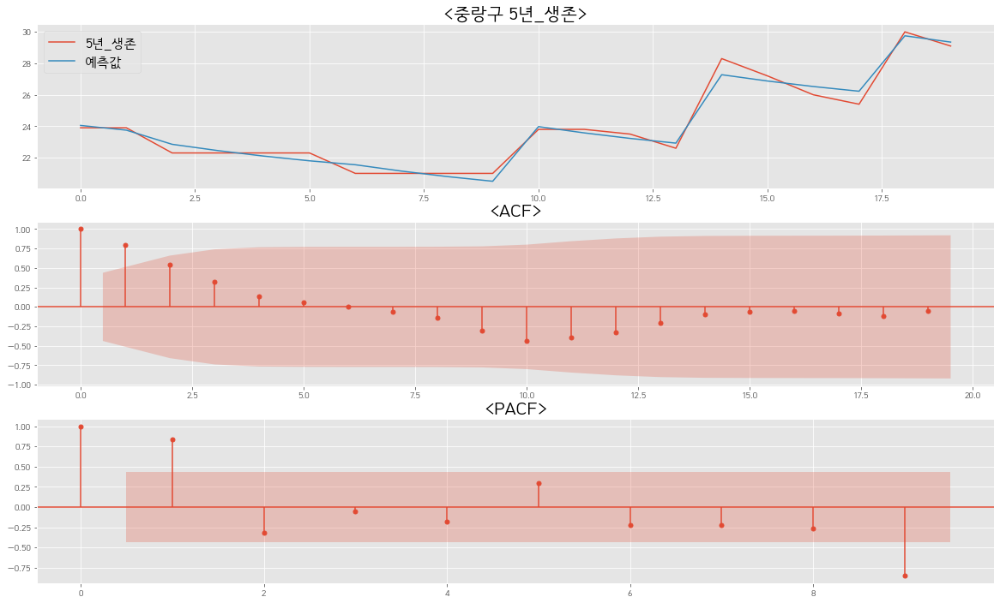

In [230]:
for i in range(0,25):
    df_survive = dat_survive[dat_survive['행정구역'] == region[i]]
    x = np.array(df_survive.iloc[:,1:-1])
    y = np.array(df_survive.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='5년_생존')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 5년_생존>",fontsize=20)
    plt.legend(fontsize=15)
    
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

# 변수 4 : 최근 10년 평균영업기간

In [187]:
x4 = data.iloc[:,[0,1,2,7]]
x4.columns = ["year","period","region","average"]
x4["date"] = 0

for i in range(0,len(x1)):
    x4["date"][i] = str(x4.loc[:,"year"][i])+str("-")+str(x4.loc[:,'period'][i])
x4

,year,period,region,average,date
0,2016,3,종로구,3.1,2016-3
1,2016,3,중구,3.2,2016-3
2,2016,3,용산구,3.0,2016-3
3,2016,3,성동구,3.0,2016-3
4,2016,3,광진구,3.0,2016-3
...,...,...,...,...,...
495,2021,2,관악구,2.4,2021-2
496,2021,2,서초구,2.8,2021-2
497,2021,2,강남구,2.6,2021-2
498,2021,2,송파구,2.5,2021-2


## 최근 10년 평균영업기간 시계열도

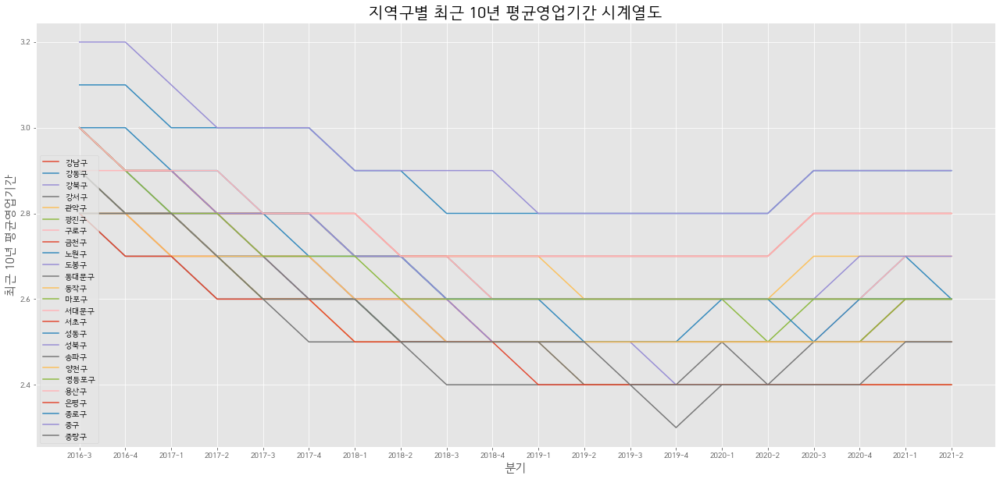

In [195]:
plt.figure(figsize=(22,10))
plt.title("지역구별 최근 10년 평균영업기간 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("최근 10년 평균영업기간",fontsize=15)
for i in range(0,25):
    plt.plot(date, x4.average[x4.region == region[i]],label=region[i])
    plt.legend()

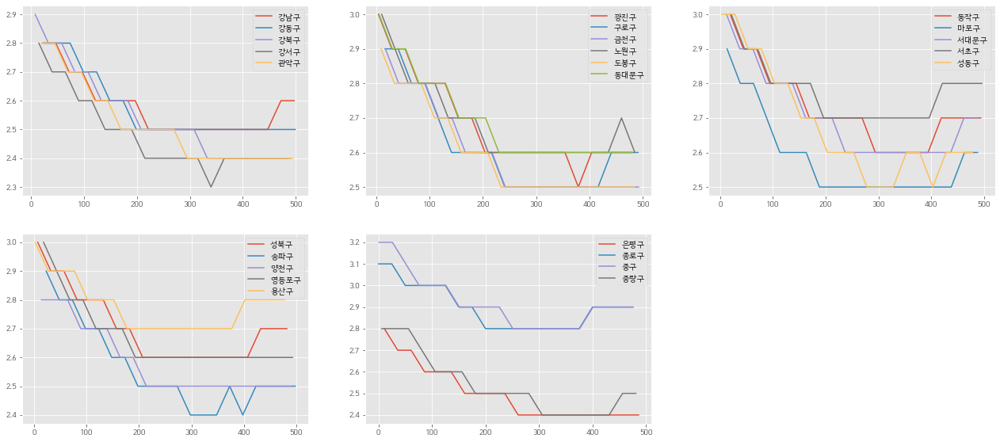

In [197]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x4.average[x4.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x4.average[x4.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x4.average[x4.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x4.average[x4.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x4.average[x4.region == region[i]],label=region[i])
    plt.legend()


- 최근 10년 평균영업기간이 계속해서 감소하다가 최근에 증가하는 추세

## 2021년 3,4분기 예측

In [233]:
dat_average = pd.concat([data['행정구역'], dummy], axis=1)
dat_average = pd.concat([dat_average, dummy2], axis=1)
dat_average = pd.concat([dat_average, x4.average], axis=1)
dat_average

,행정구역,1,2,3,4,2016,2017,2018,2019,2020,2021,average
0,종로구,0,0,1,0,1,0,0,0,0,0,3.1
1,중구,0,0,1,0,1,0,0,0,0,0,3.2
2,용산구,0,0,1,0,1,0,0,0,0,0,3.0
3,성동구,0,0,1,0,1,0,0,0,0,0,3.0
4,광진구,0,0,1,0,1,0,0,0,0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,관악구,0,1,0,0,0,0,0,0,0,1,2.4
496,서초구,0,1,0,0,0,0,0,0,0,1,2.8
497,강남구,0,1,0,0,0,0,0,0,0,1,2.6
498,송파구,0,1,0,0,0,0,0,0,0,1,2.5


In [278]:
predict4 = np.array([])

for i in range(0, 25):
    df_average = dat_average[dat_average['행정구역'] == region[i]]
    x = np.array(df_average.iloc[:,1:11])
    y = np.array(df_average.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict4 = np.append(predict4, lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_average = dat_average[dat_average['행정구역'] == region[i]]
    x = np.array(df_average.iloc[:,1:11])
    y = np.array(df_average.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict4 = np.append(predict4, lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [279]:
predict4

array([2.55  , 2.4725, 2.3675, 2.3675, 2.3625, 2.585 , 2.5725, 2.4825,
       2.6325, 2.4825, 2.595 , 2.71  , 2.56  , 2.695 , 2.81  , 2.515 ,
       2.675 , 2.4825, 2.4625, 2.5725, 2.7975, 2.3975, 2.9   , 2.9125,
       2.425 , 2.55  , 2.4525, 2.3075, 2.3075, 2.3625, 2.565 , 2.5525,
       2.4425, 2.5925, 2.4425, 2.555 , 2.69  , 2.54  , 2.655 , 2.79  ,
       2.535 , 2.675 , 2.4425, 2.4625, 2.5525, 2.7775, 2.3775, 2.9   ,
       2.9125, 2.425 ])

## 모형 잔차 검정

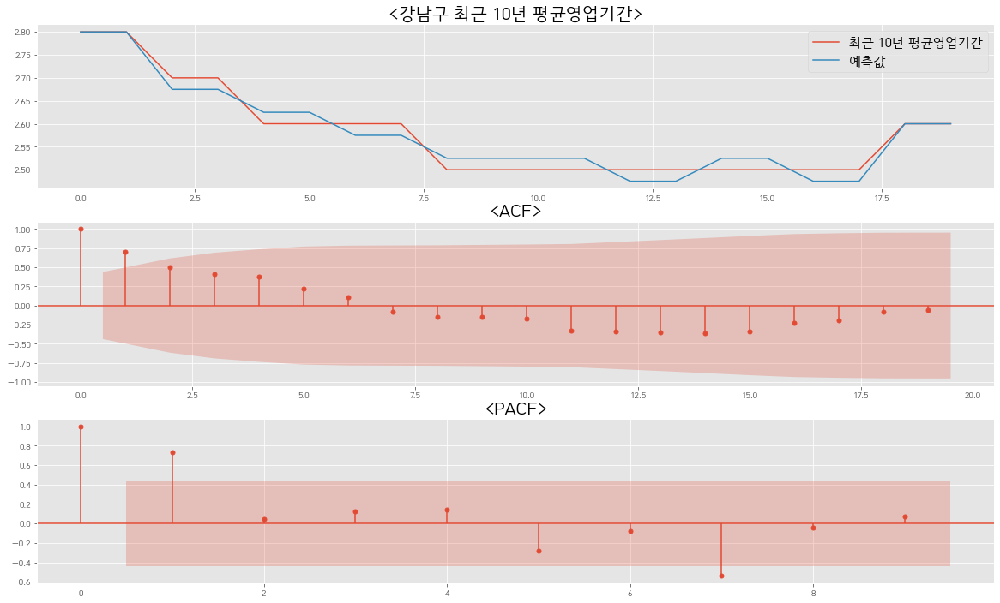

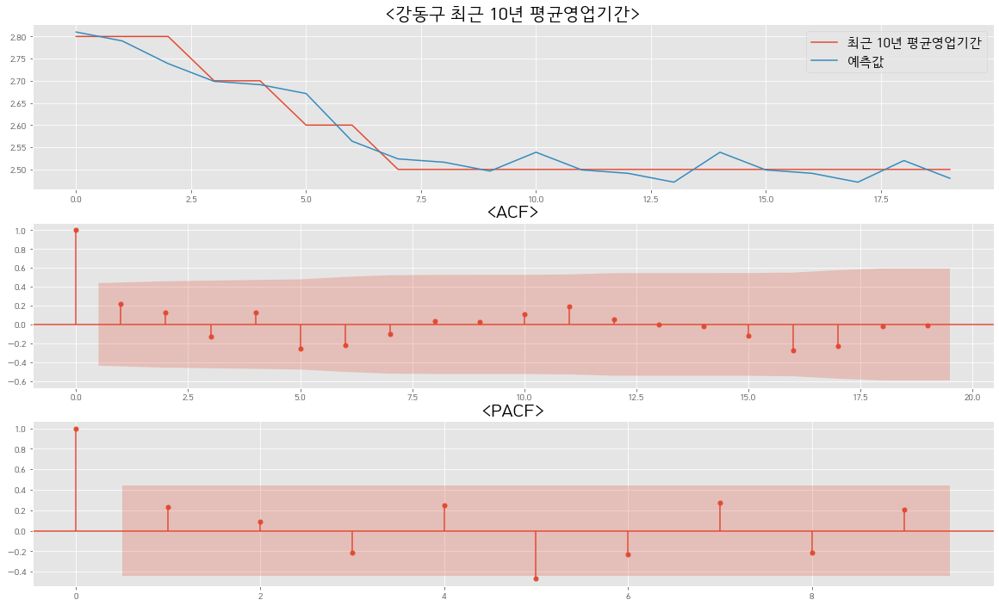

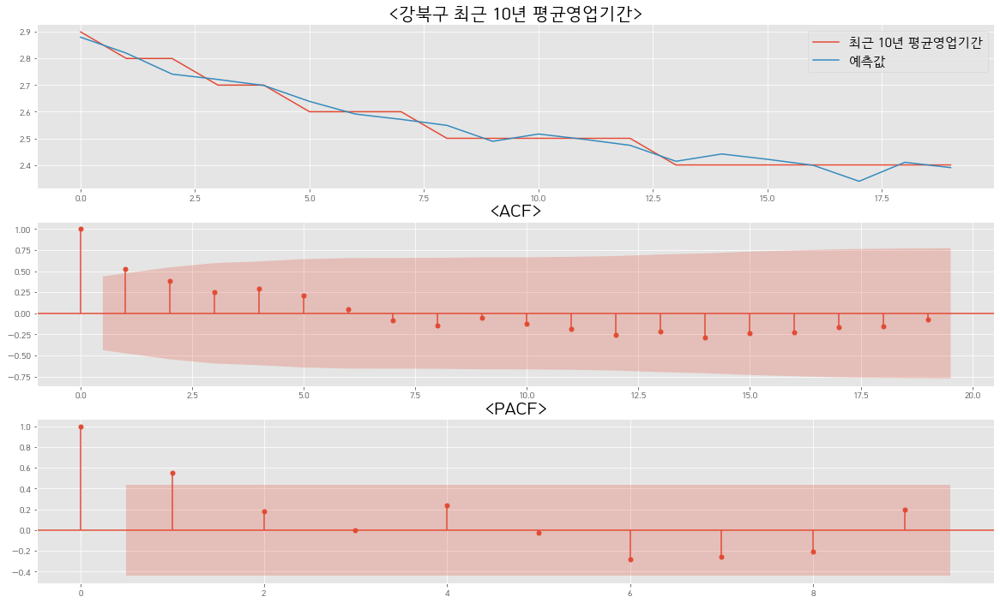

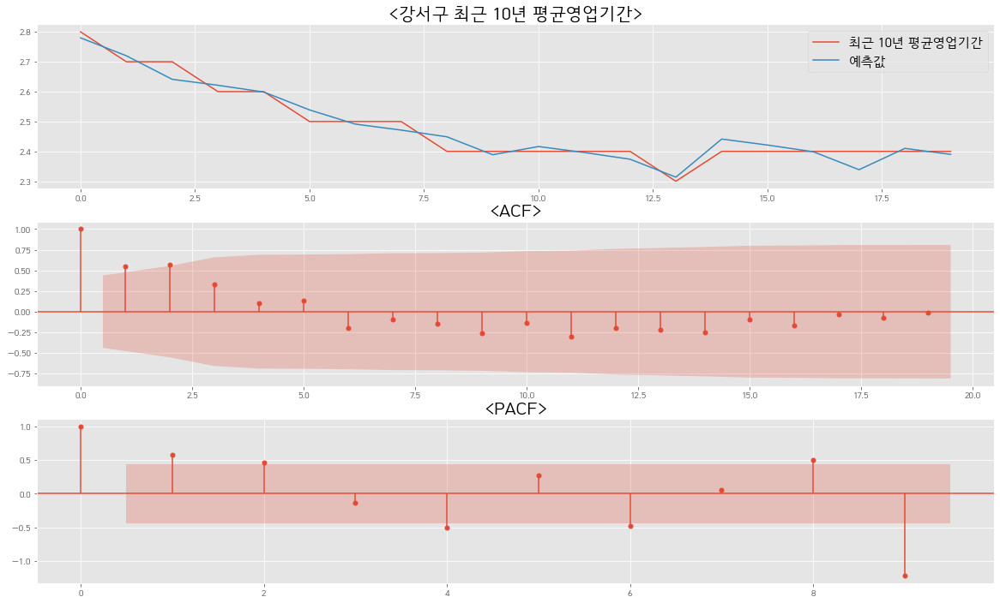

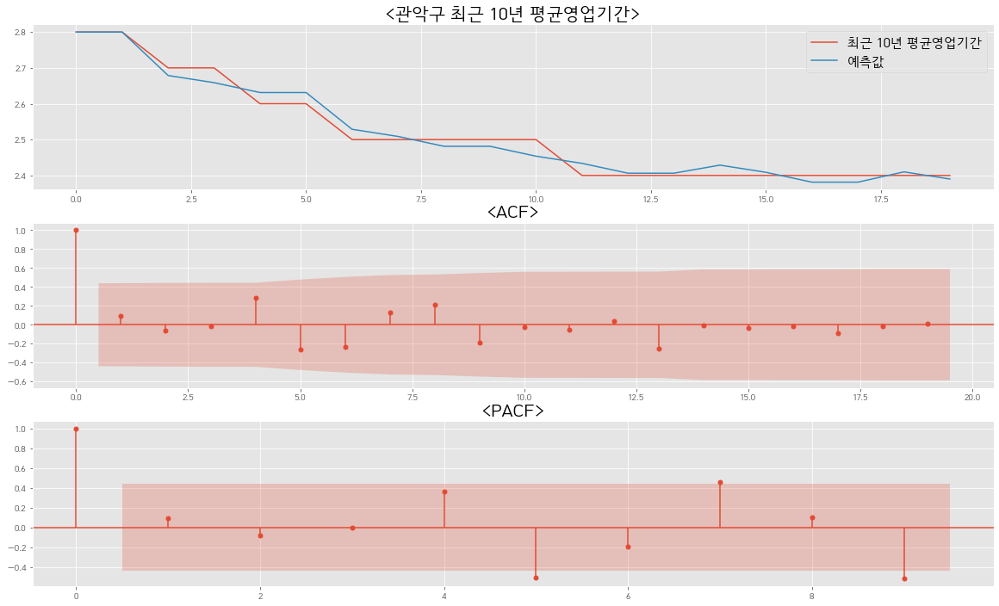

...

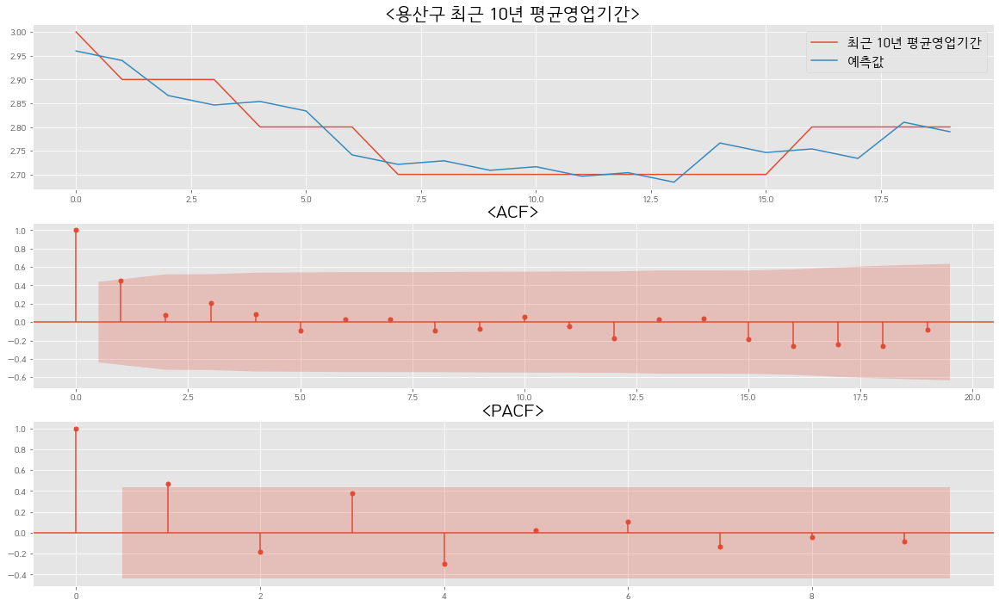

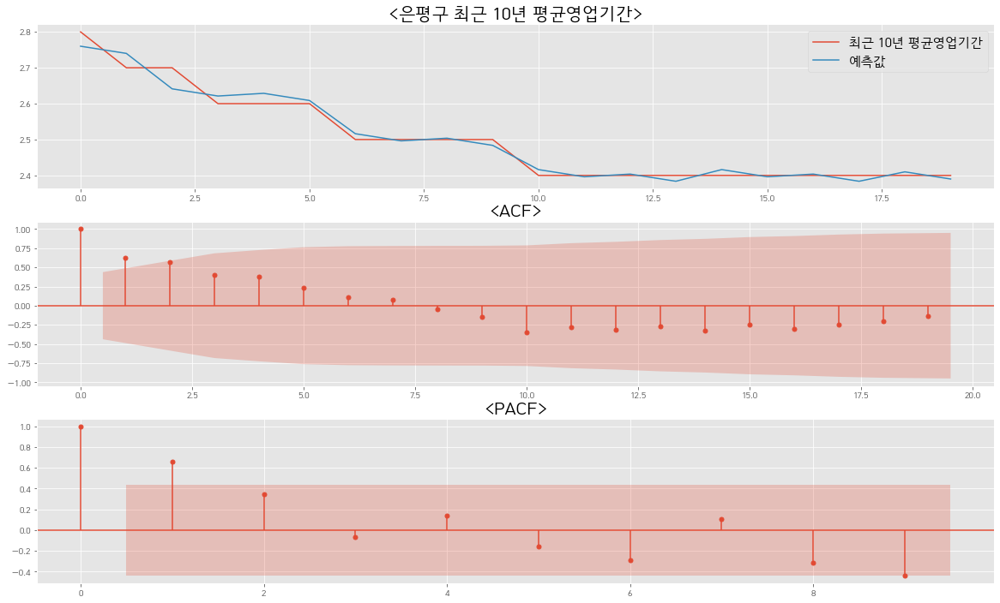

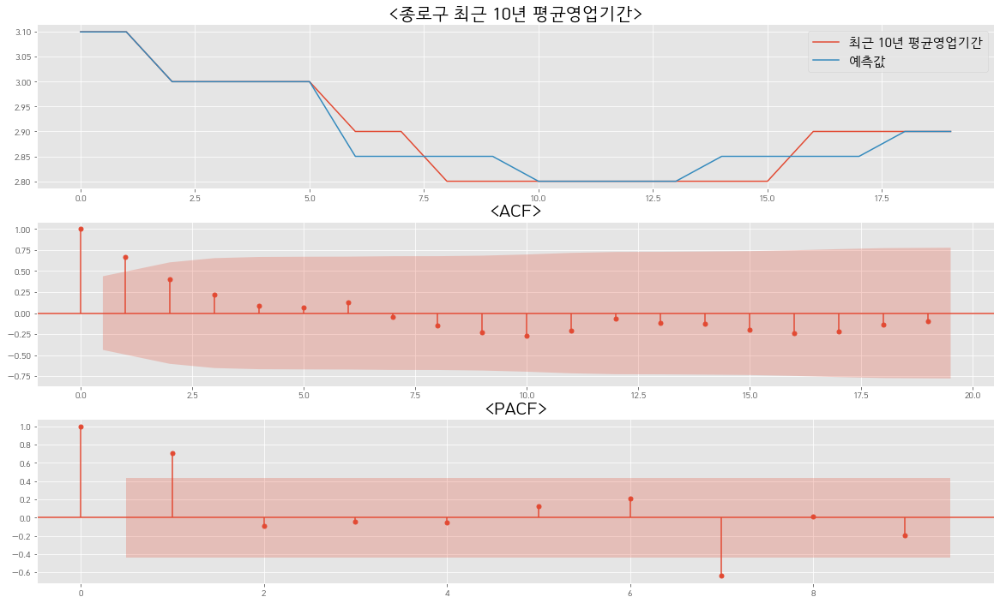

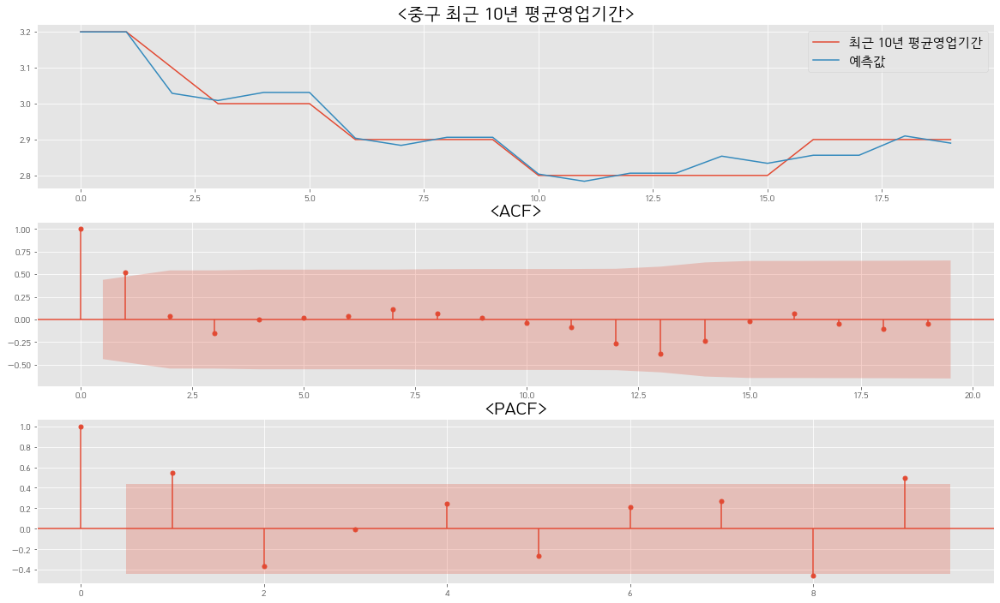

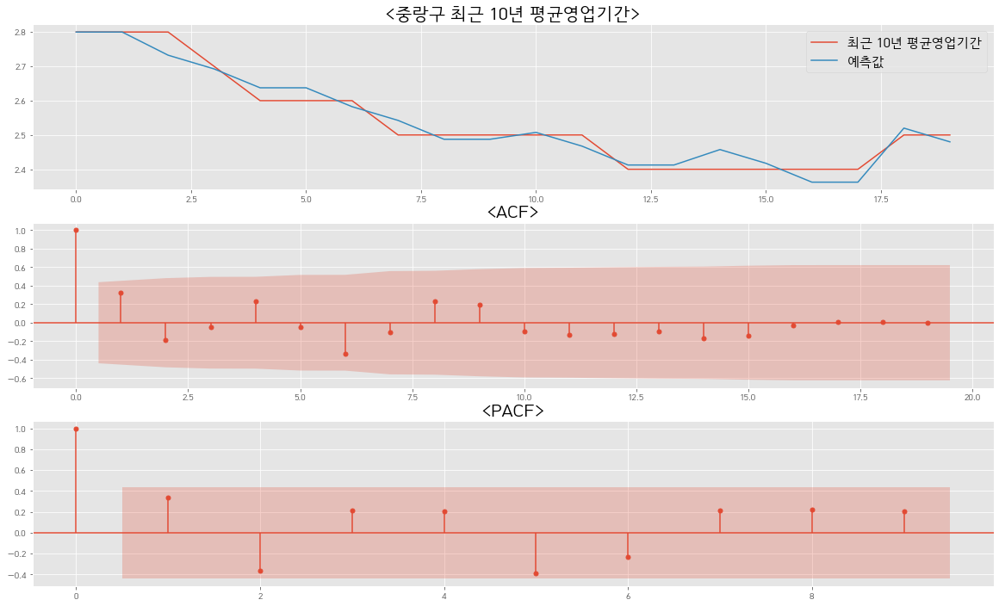

In [237]:
for i in range(0,25):
    df_average = dat_average[dat_average['행정구역'] == region[i]]
    x = np.array(df_average.iloc[:,1:-1])
    y = np.array(df_average.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='최근 10년 평균영업기간')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 최근 10년 평균영업기간>",fontsize=20)
    plt.legend(fontsize=15)
    
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

# 변수 5 : 프렌차이즈 점포 비율

In [203]:
x5 = data.iloc[:,[0,1,2,8]]
x5.columns = ["year","period","region","market"]
x5["date"] = 0

for i in range(0,len(x1)):
    x5["date"][i] = str(x5.loc[:,"year"][i])+str("-")+str(x5.loc[:,'period'][i])
x5

,year,period,region,market,date
0,2016,3,종로구,0.135158,2016-3
1,2016,3,중구,0.161454,2016-3
2,2016,3,용산구,0.129965,2016-3
3,2016,3,성동구,0.177305,2016-3
4,2016,3,광진구,0.186925,2016-3
...,...,...,...,...,...
495,2021,2,관악구,0.174735,2021-2
496,2021,2,서초구,0.188727,2021-2
497,2021,2,강남구,0.185957,2021-2
498,2021,2,송파구,0.205581,2021-2


## 프렌차이즈 점포 비율 시계열도

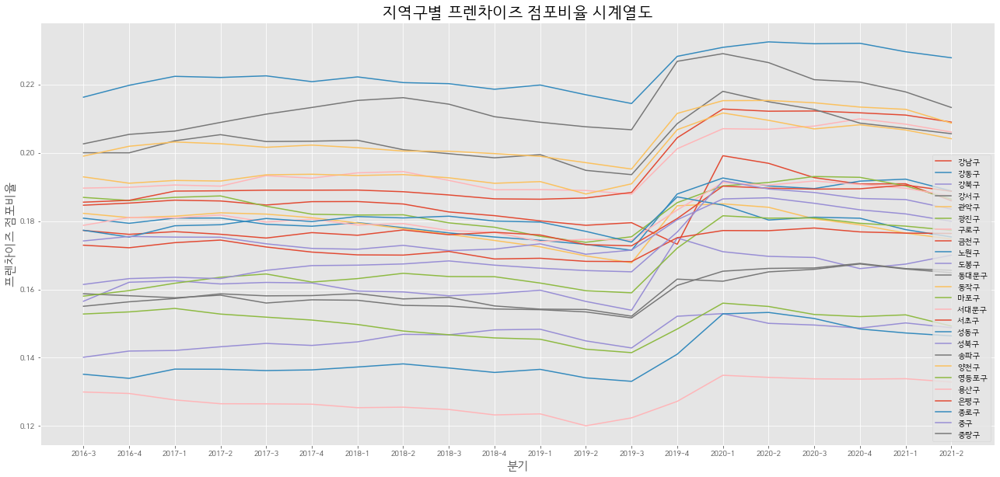

In [204]:
plt.figure(figsize=(22,10))
plt.title("지역구별 프렌차이즈 점포비율 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("프렌차이즈 점포비율",fontsize=15)
for i in range(0,25):
    plt.plot(date, x5.market[x5.region == region[i]],label=region[i])
    plt.legend()

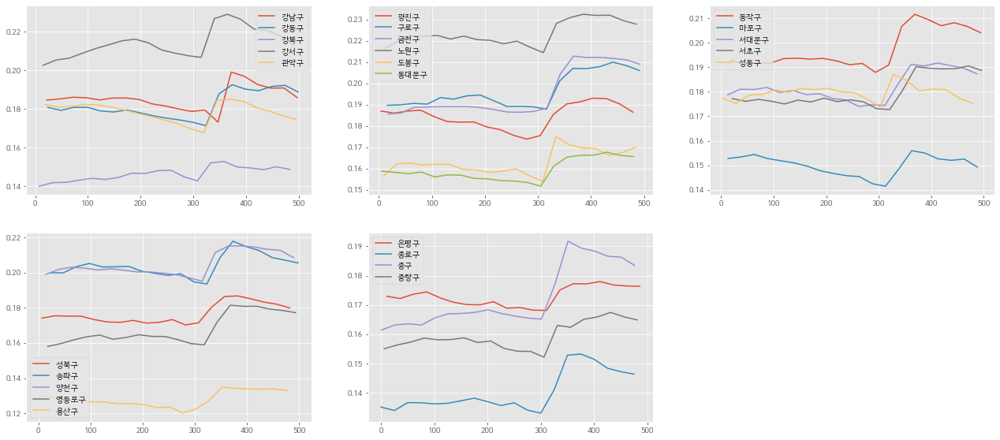

In [201]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x5.market[x5.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x5.market[x5.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x5.market[x5.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x5.market[x5.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x5.market[x5.region == region[i]],label=region[i])
    plt.legend()


- 2019년 3분기에서 2019년 4분기 사이에 프렌차이즈 점포비율의 급격한 증가가 보임

## 2021년 3,4분기 예측

In [238]:
dat_market = pd.concat([data['행정구역'], dummy], axis=1)
dat_market = pd.concat([dat_market, dummy2], axis=1)
dat_market = pd.concat([dat_market, x5.market], axis=1)
dat_market

,행정구역,1,2,3,4,2016,2017,2018,2019,2020,2021,market
0,종로구,0,0,1,0,1,0,0,0,0,0,0.135158
1,중구,0,0,1,0,1,0,0,0,0,0,0.161454
2,용산구,0,0,1,0,1,0,0,0,0,0,0.129965
3,성동구,0,0,1,0,1,0,0,0,0,0,0.177305
4,광진구,0,0,1,0,1,0,0,0,0,0,0.186925
...,...,...,...,...,...,...,...,...,...,...,...,...
495,관악구,0,1,0,0,0,0,0,0,0,1,0.174735
496,서초구,0,1,0,0,0,0,0,0,0,1,0.188727
497,강남구,0,1,0,0,0,0,0,0,0,1,0.185957
498,송파구,0,1,0,0,0,0,0,0,0,1,0.205581


In [291]:
predict5 = np.array([])

for i in range(0, 25):
    df_market = dat_market[dat_market['행정구역'] == region[i]]
    x = np.array(df_market.iloc[:,1:11])
    y = np.array(df_market.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict5 = np.append(predict5, lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_makret = dat_market[dat_market['행정구역'] == region[i]]
    x = np.array(df_market.iloc[:,1:11])
    y = np.array(df_market.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict5 = np.append(predict5,lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [292]:
predict5

array([0.18587374, 0.18902271, 0.14873435, 0.21427931, 0.17364142,
       0.18807598, 0.20751492, 0.21044844, 0.22745628, 0.16697657,
       0.16506984, 0.20558543, 0.1486874 , 0.18783035, 0.18888721,
       0.17599276, 0.17986105, 0.20387143, 0.20945644, 0.17786915,
       0.13315463, 0.17646173, 0.14578646, 0.18506597, 0.1655127 ,
       0.16776517, 0.16776517, 0.16776517, 0.16776517, 0.16776517,
       0.16776517, 0.16776517, 0.16776517, 0.16776517, 0.16776517,
       0.16776517, 0.16776517, 0.16776517, 0.16776517, 0.16776517,
       0.16776517, 0.16776517, 0.16776517, 0.16776517, 0.16776517,
       0.16776517, 0.16776517, 0.16776517, 0.16776517, 0.16776517])

## 모형 잔차 검정

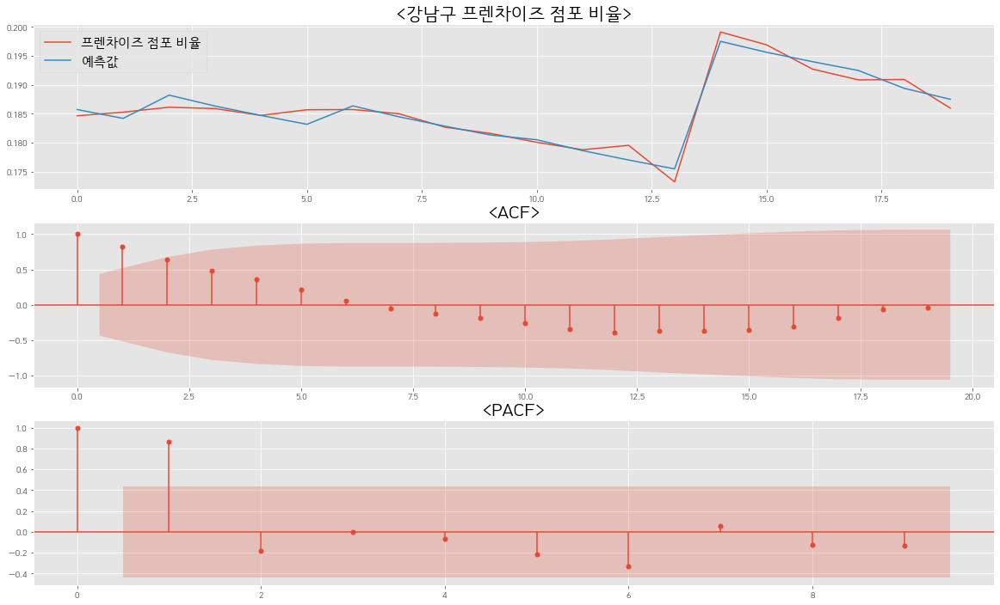

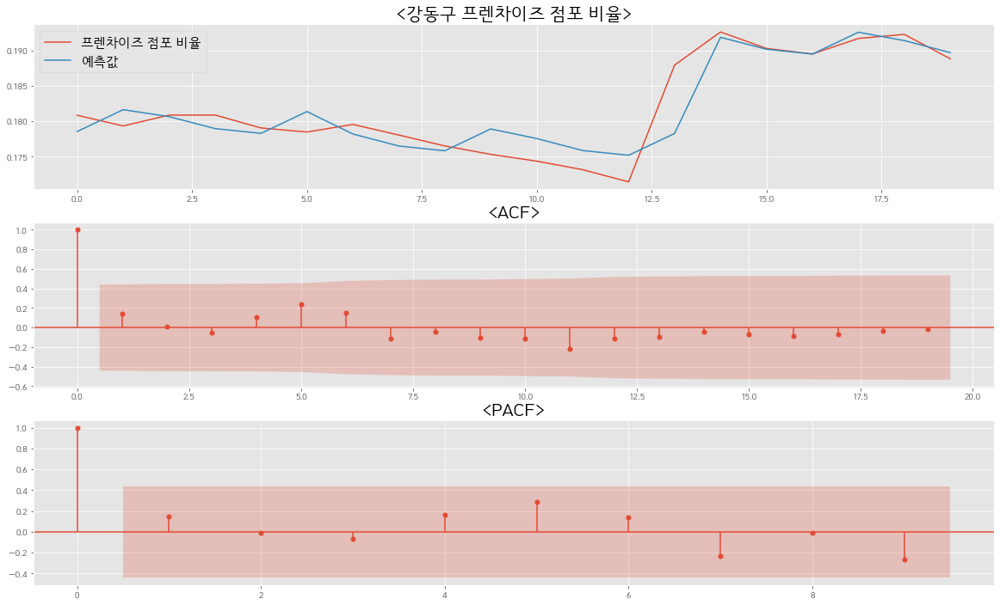

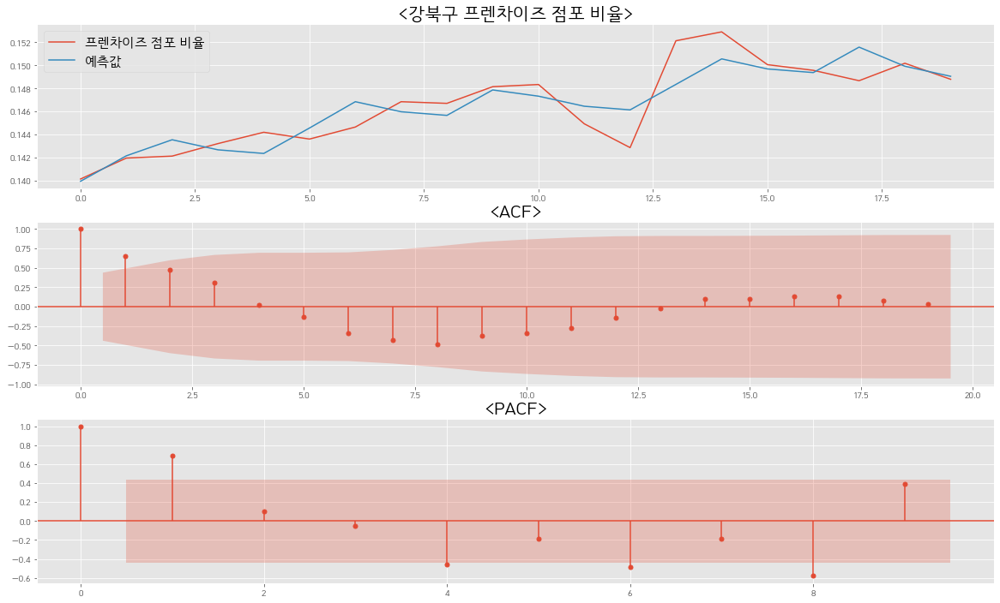

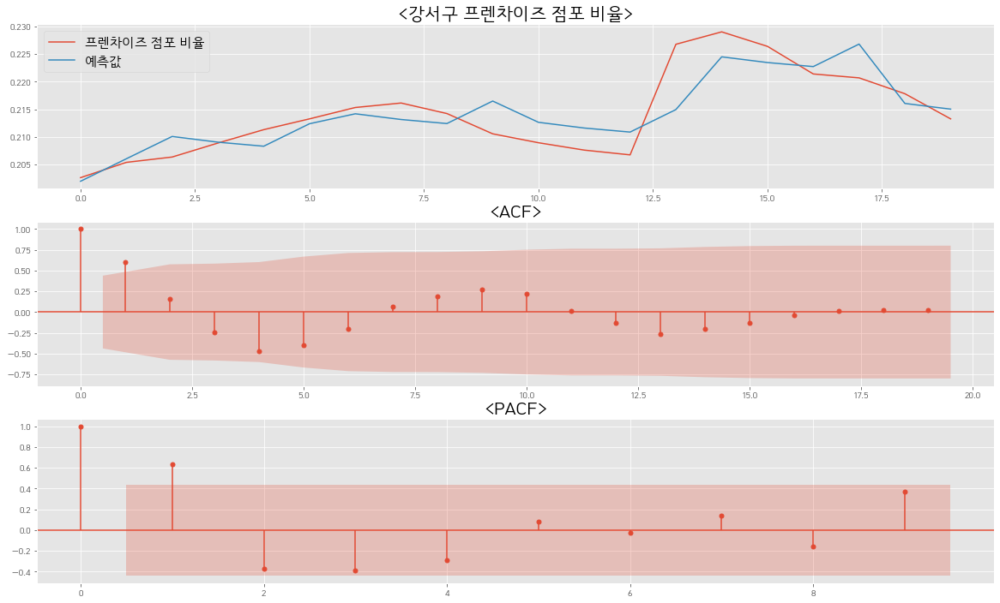

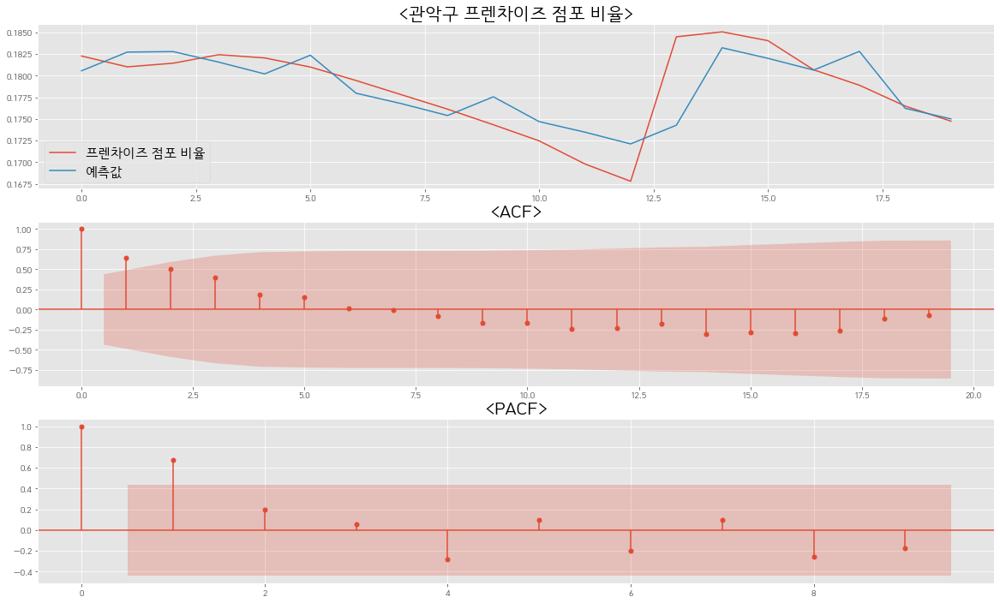

...

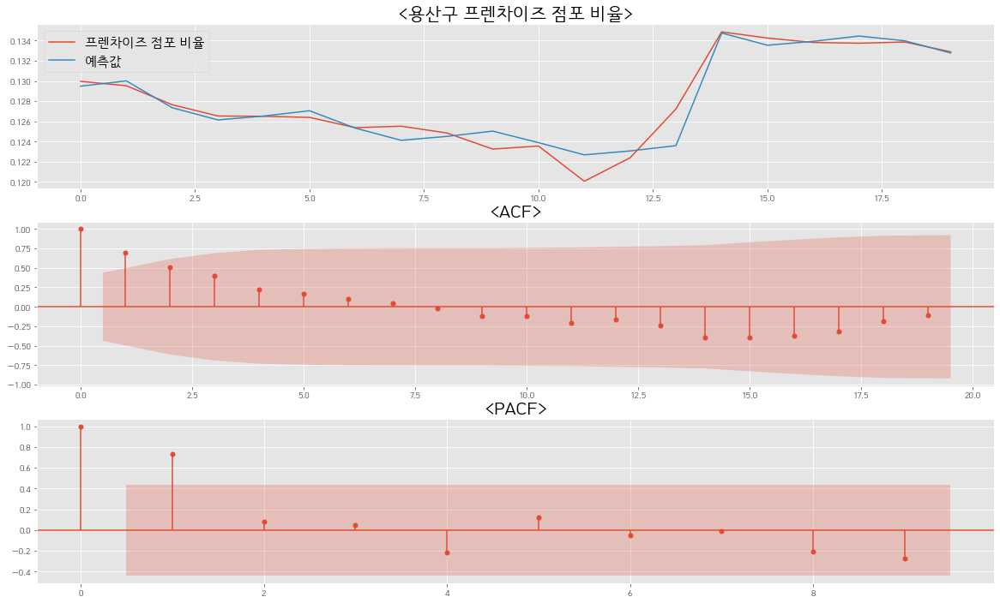

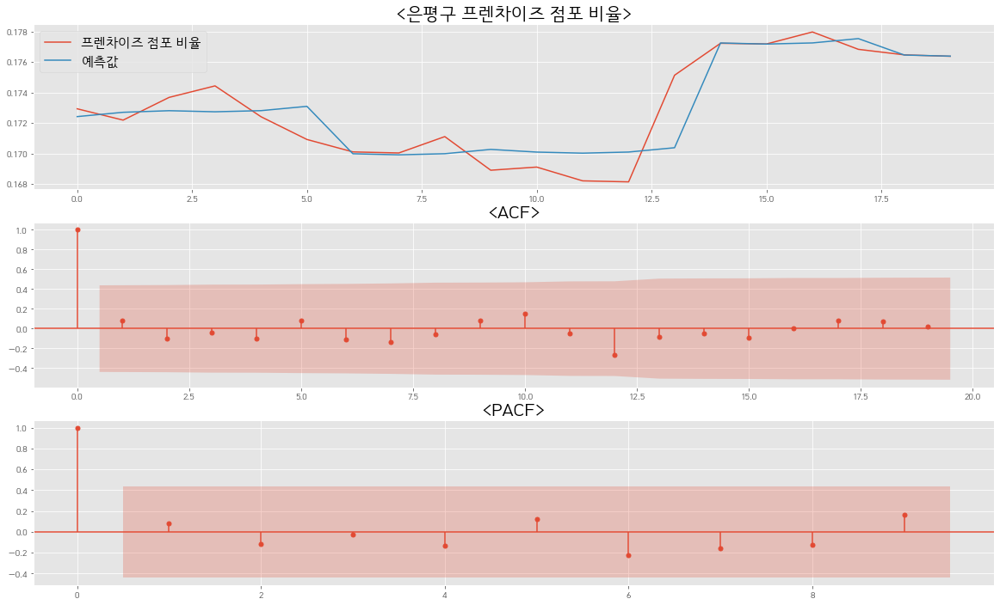

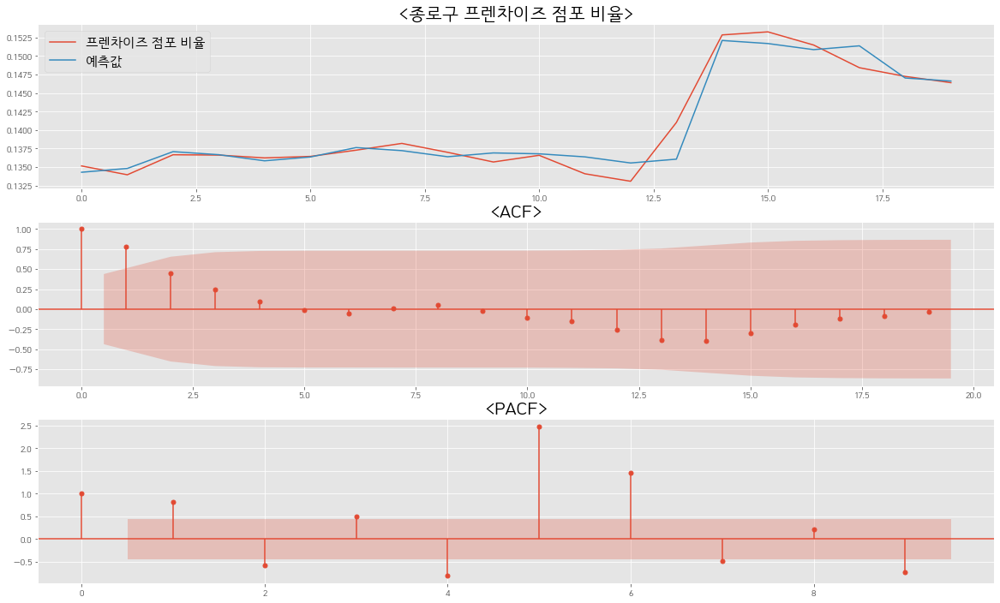

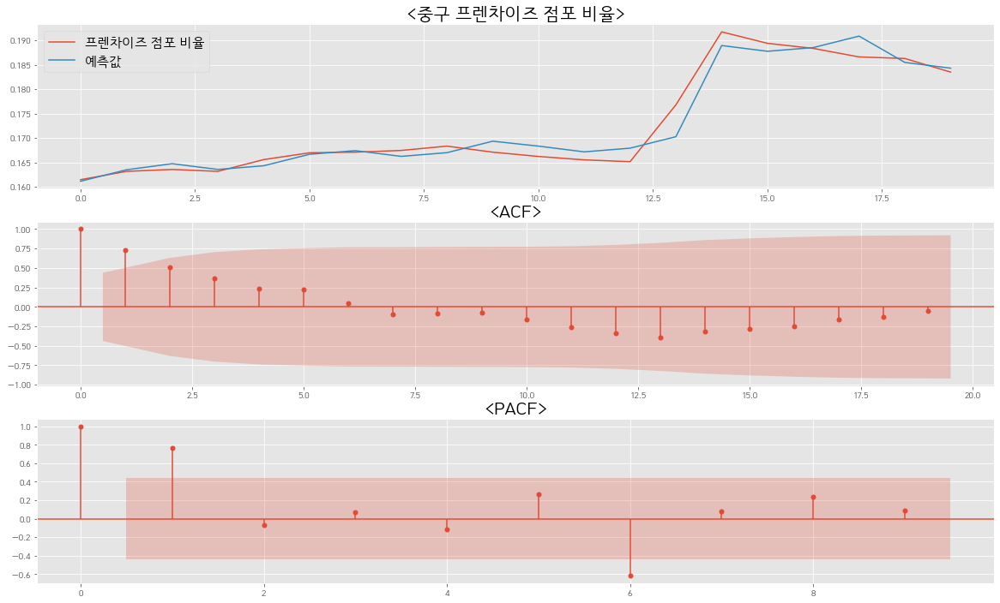

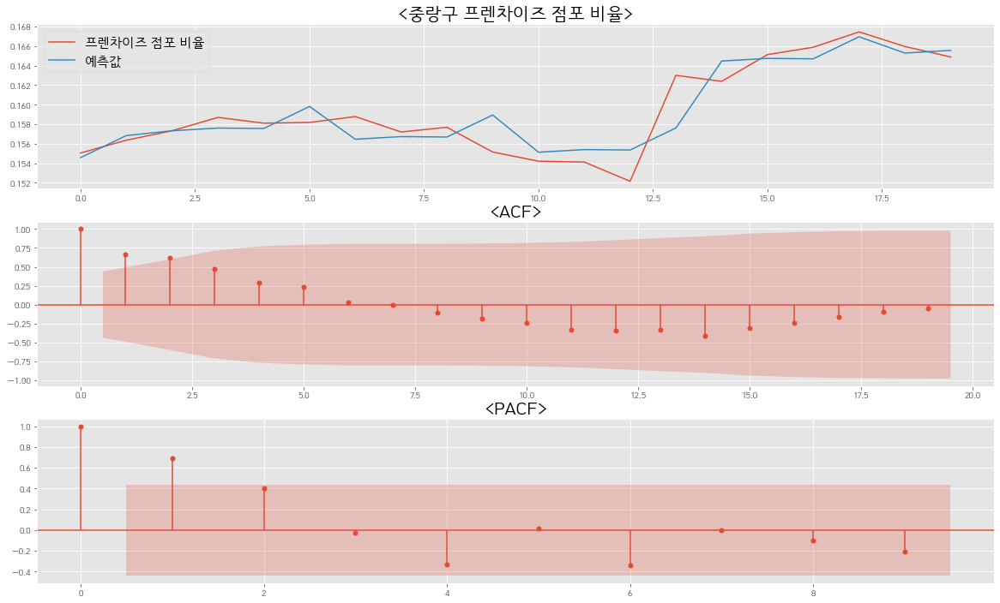

In [240]:
for i in range(0,25):
    df_market = dat_market[dat_market['행정구역'] == region[i]]
    x = np.array(df_market.iloc[:,1:-1])
    y = np.array(df_market.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='프렌차이즈 점포 비율')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 프렌차이즈 점포 비율>",fontsize=20)
    plt.legend(fontsize=15)
    
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

# 변수 6 : 직장 인구 대비 주거 인구

In [202]:
x6 = data.iloc[:,[0,1,2,9]]
x6.columns = ["year","period","region","people"]
x6["date"] = 0

for i in range(0,len(x1)):
    x6["date"][i] = str(x6.loc[:,"year"][i])+str("-")+str(x6.loc[:,'period'][i])
x6

,year,period,region,people,date
0,2016,3,종로구,2.016129,2016-3
1,2016,3,중구,4.700000,2016-3
2,2016,3,용산구,0.742268,2016-3
3,2016,3,성동구,0.673333,2016-3
4,2016,3,광진구,0.228426,2016-3
...,...,...,...,...,...
495,2021,2,관악구,0.150602,2021-2
496,2021,2,서초구,1.359551,2021-2
497,2021,2,강남구,2.078014,2021-2
498,2021,2,송파구,0.597990,2021-2


## 직장 인구 대비 주거 인구 시계열도

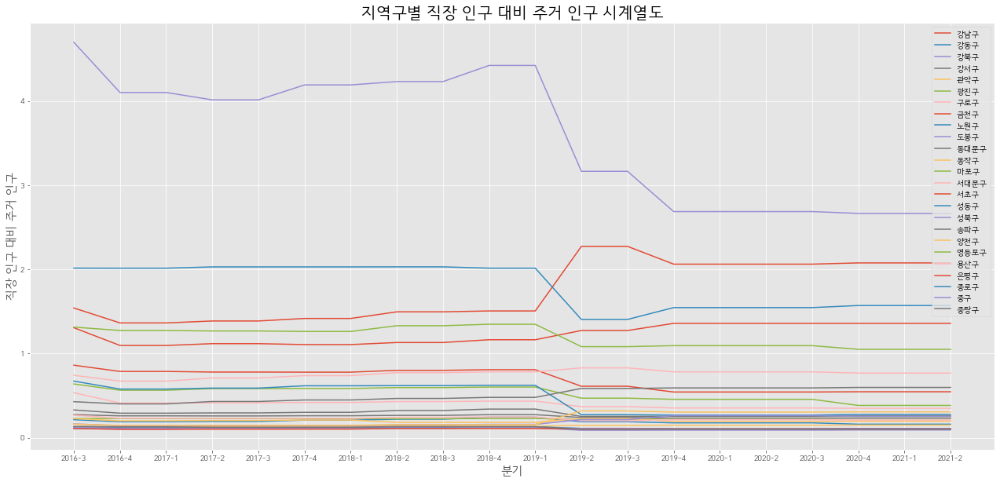

In [206]:
plt.figure(figsize=(22,10))
plt.title("지역구별 직장 인구 대비 주거 인구 시계열도",fontsize=20)
plt.xlabel("분기",fontsize=15)
plt.ylabel("직장 인구 대비 주거 인구",fontsize=15)
for i in range(0,25):
    plt.plot(date, x6.people[x6.region == region[i]],label=region[i])
    plt.legend()

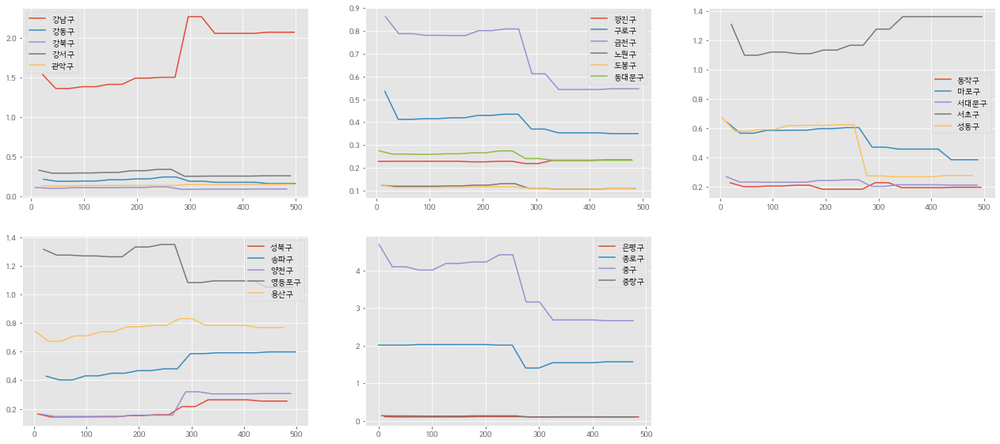

In [207]:
plt.figure(figsize=(22,15))
for i in range(0,5):
    plt.subplot(3, 3, 1)
    plt.plot(x6.people[x6.region == region[i]],label=region[i])
    plt.legend()

for i in range(5,11):
    plt.subplot(3, 3, 2)
    plt.plot(x6.people[x6.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(11,16):
    plt.subplot(3, 3, 3)
    plt.plot(x6.people[x6.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(16,21):
    plt.subplot(3, 3, 4)
    plt.plot(x6.people[x6.region == region[i]],label=region[i])
    plt.legend()
    
for i in range(21,25):
    plt.subplot(3, 3, 5)
    plt.plot(x6.people[x6.region == region[i]],label=region[i])
    plt.legend()


- 지역구별로 직장 인구 대비 주거인구의 값의 큰 차이가 나는 것을 알 수 있음.

## 2021년 3,4분기 예측

In [241]:
dat_people = pd.concat([data['행정구역'], dummy], axis=1)
dat_people = pd.concat([dat_people, dummy2], axis=1)
dat_people = pd.concat([dat_people, x6.people], axis=1)
dat_people

,행정구역,1,2,3,4,2016,2017,2018,2019,2020,2021,people
0,종로구,0,0,1,0,1,0,0,0,0,0,2.016129
1,중구,0,0,1,0,1,0,0,0,0,0,4.700000
2,용산구,0,0,1,0,1,0,0,0,0,0,0.742268
3,성동구,0,0,1,0,1,0,0,0,0,0,0.673333
4,광진구,0,0,1,0,1,0,0,0,0,0,0.228426
...,...,...,...,...,...,...,...,...,...,...,...,...
495,관악구,0,1,0,0,0,0,0,0,0,1,0.150602
496,서초구,0,1,0,0,0,0,0,0,0,1,1.359551
497,강남구,0,1,0,0,0,0,0,0,0,1,2.078014
498,송파구,0,1,0,0,0,0,0,0,0,1,0.597990


In [275]:
predict6 = np.array([])

for i in range(0, 25):
    df_people = dat_people[dat_people['행정구역'] == region[i]]
    x = np.array(df_people.iloc[:,1:11])
    y = np.array(df_people.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict6 = np.append(predict6,lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]])))
    
for i in range(0, 25):
    df_people = dat_people[dat_people['행정구역'] == region[i]]
    x = np.array(df_people.iloc[:,1:11])
    y = np.array(df_people.iloc[:, 11])

    lr = LinearRegression()
    lr.fit(x, y)
    predict6 = np.append(predict6, lr.predict(np.array([[0,0,0,1,0,0,0,0,0,1]])))

In [276]:
predict6

array([2.20046906, 0.15894966, 0.09096686, 0.25606419, 0.153296  ,
       0.23352937, 0.35550805, 0.52958329, 0.10731189, 0.10948745,
       0.23077181, 0.20110929, 0.37675454, 0.21077573, 1.40278546,
       0.24517181, 0.26575398, 0.62081846, 0.32987593, 1.02918149,
       0.78982815, 0.10490673, 1.50105315, 2.55967849, 0.09879041,
       2.13384664, 0.15613654, 0.09136313, 0.25427645, 0.15320648,
       0.23731793, 0.32883661, 0.50291403, 0.10771185, 0.1070904 ,
       0.22850995, 0.19063665, 0.34625011, 0.20621322, 1.38200976,
       0.23304662, 0.27056563, 0.62414347, 0.32441482, 1.01716188,
       0.77111422, 0.10354304, 1.53081498, 2.41432151, 0.09801018])

## 모형 잔차 검정

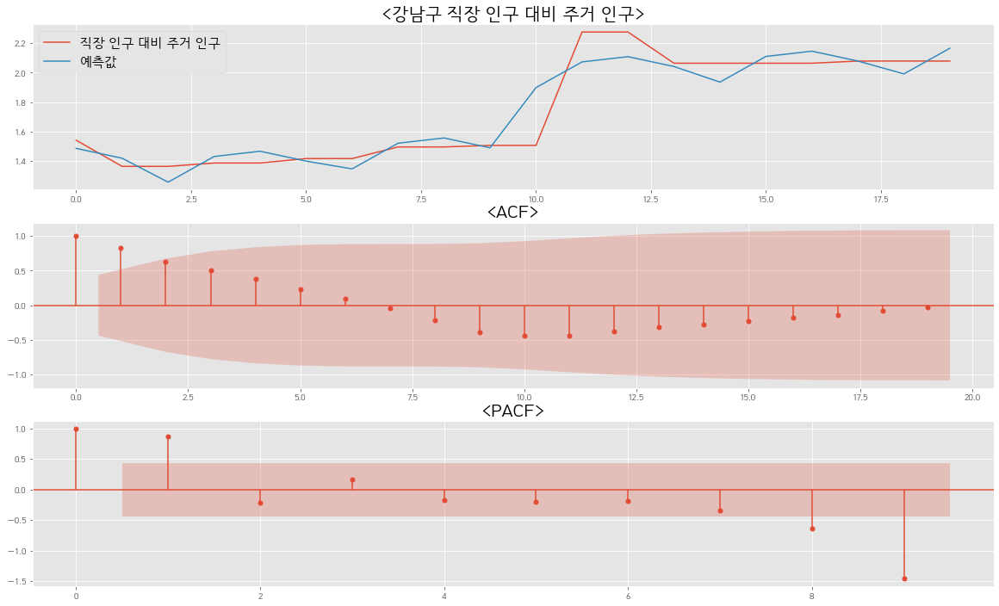

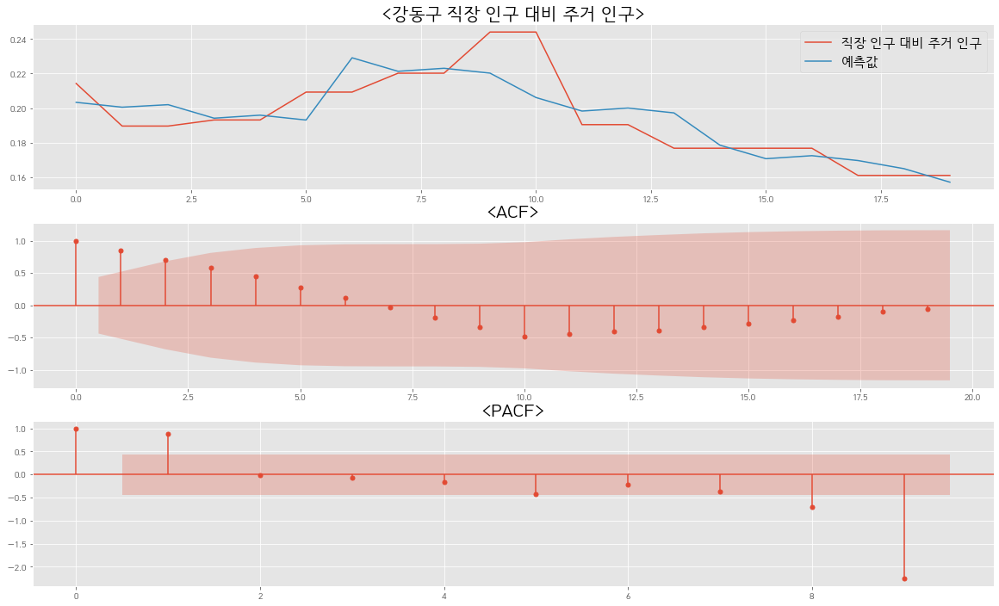

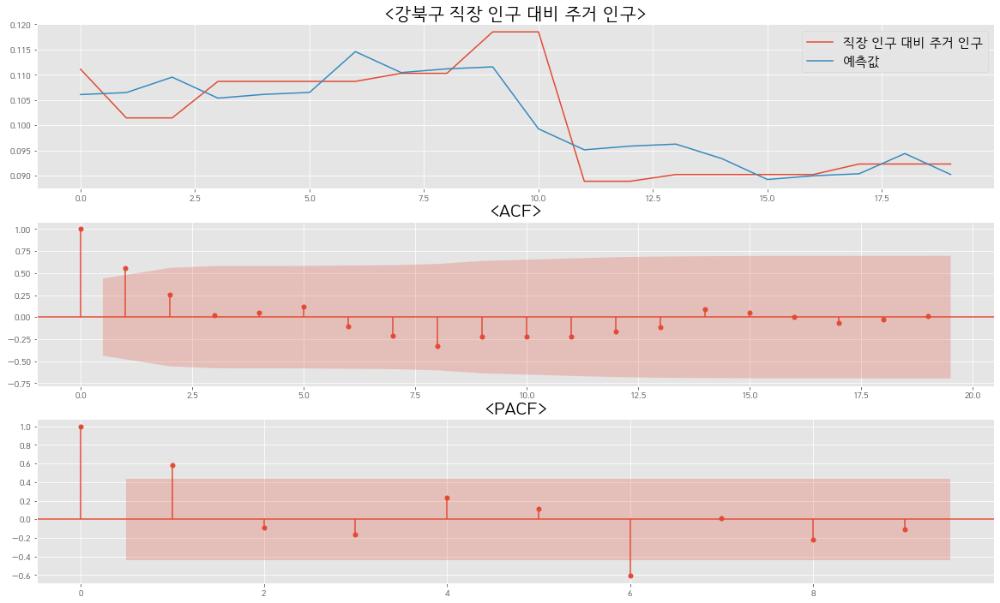

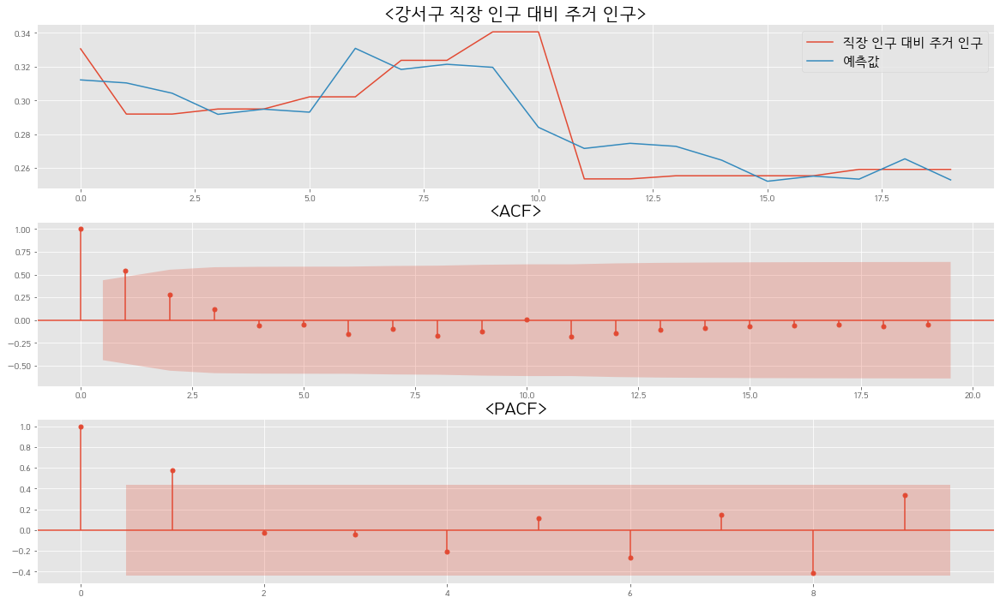

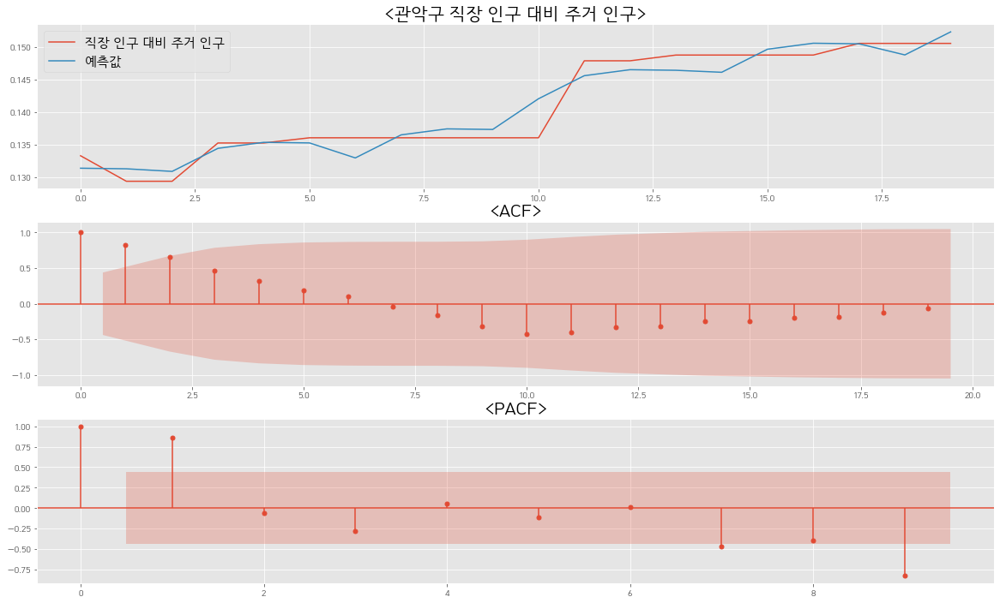

...

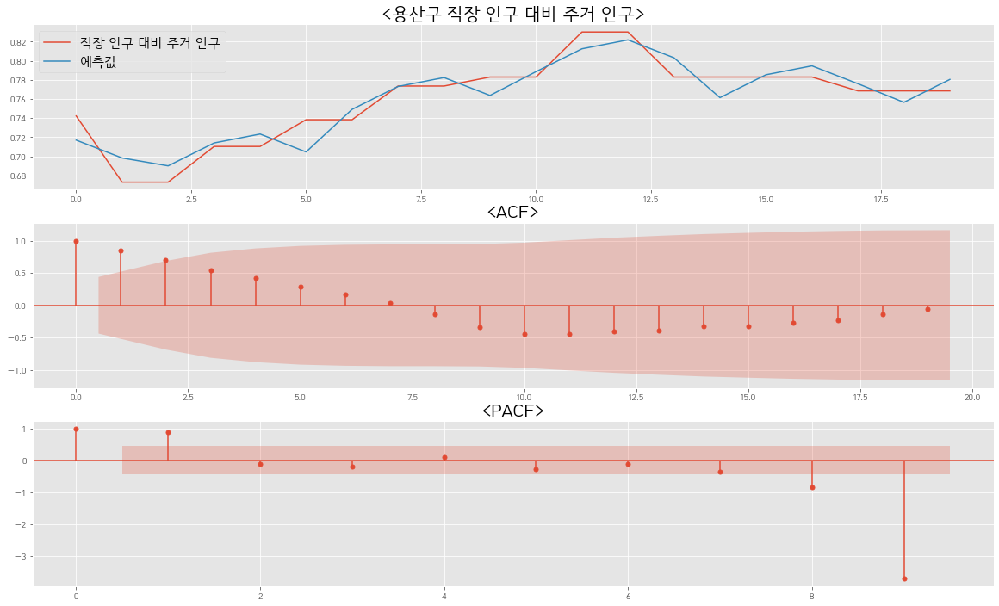

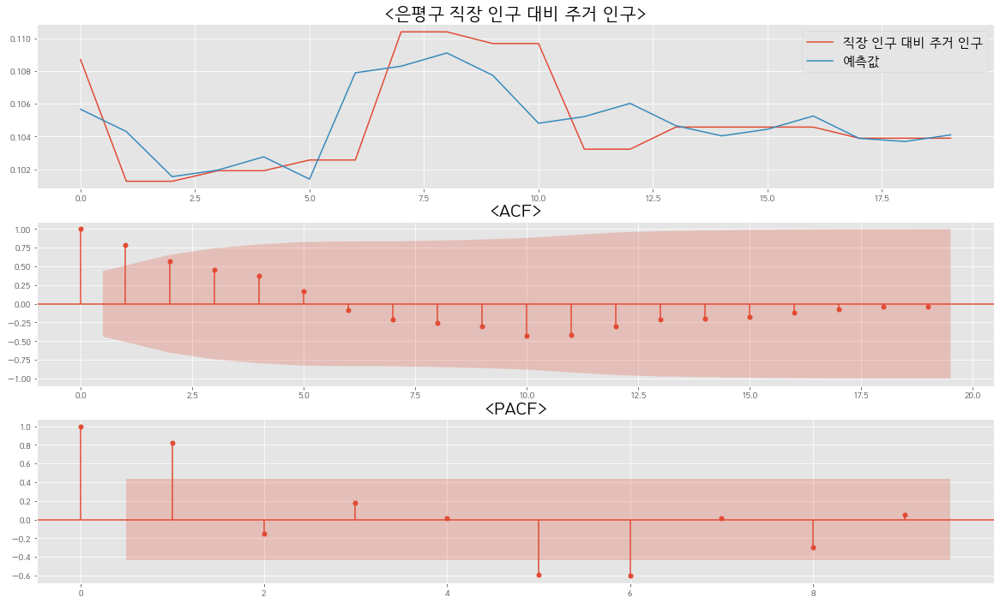

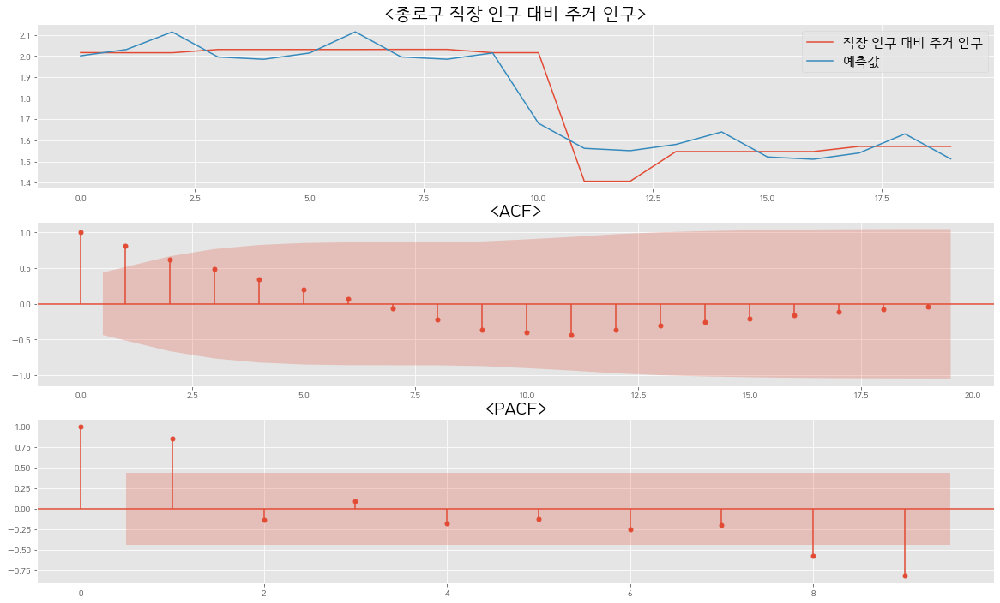

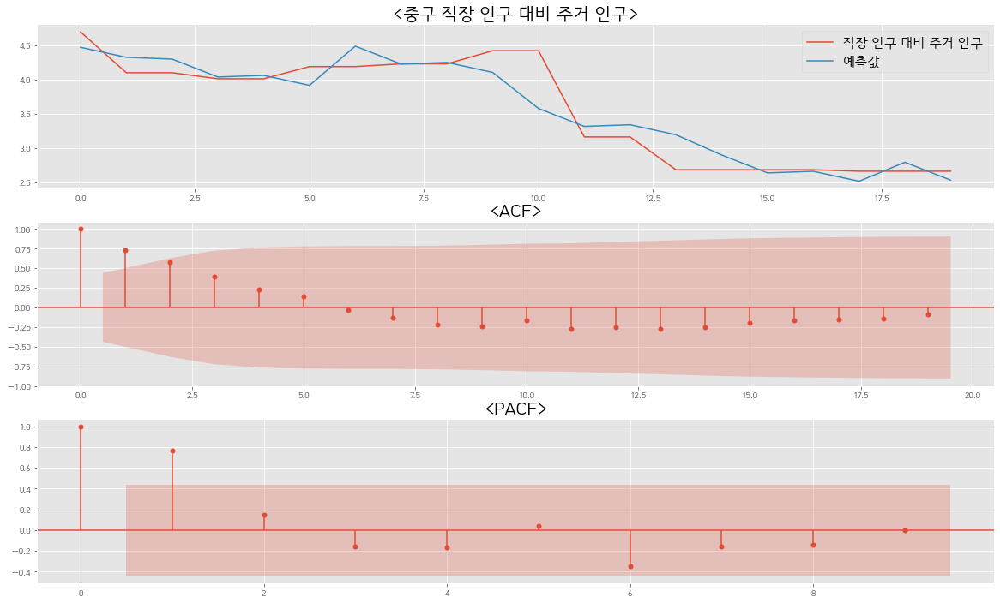

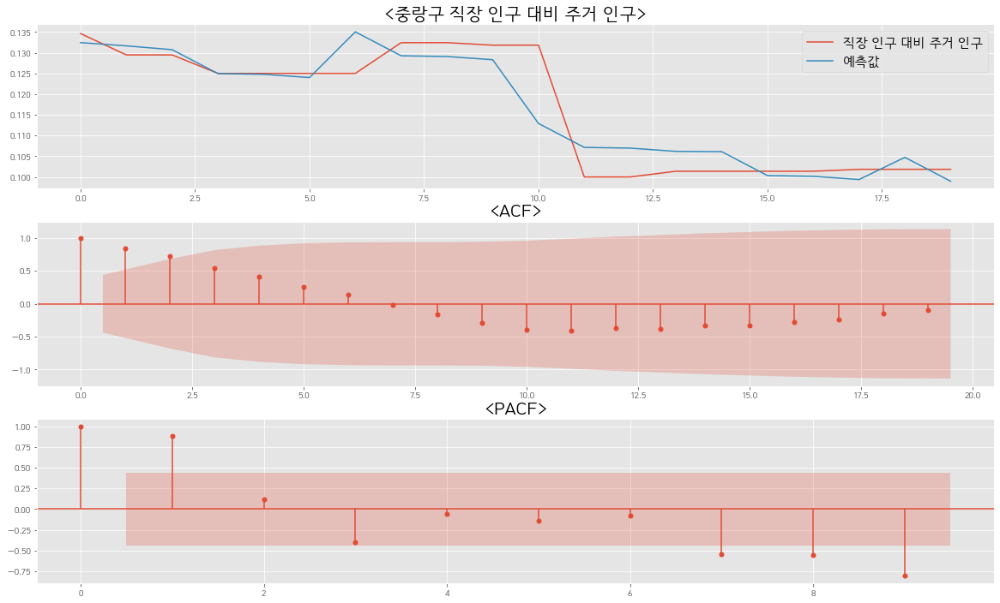

In [243]:
for i in range(0,25):
    df_people = dat_people[dat_people['행정구역'] == region[i]]
    x = np.array(df_people.iloc[:,1:-1])
    y = np.array(df_people.iloc[:, -1])
    
    lr = LinearRegression()
    lr.fit(x, y)
    lr.predict(np.array([[0,0,1,0,0,0,0,0,0,1]]))
    
    e_hat = y - y_hat
    y_hat = lr.predict(x)
    
    fig = plt.figure(figsize=(20,12))
    
    ax1 = fig.add_subplot(311)
    plt.plot(y, label='직장 인구 대비 주거 인구')
    plt.plot(y_hat, label='예측값')
    plt.title("<" + region[i] + " 직장 인구 대비 주거 인구>",fontsize=20)
    plt.legend(fontsize=15)
    
    ax2 = fig.add_subplot(312)
    fig = sm.graphics.tsa.plot_acf(e_hat,lags=19, ax=ax2)
    plt.title("<ACF>",fontsize=20)
    
    ax3 = fig.add_subplot(313)
    fig = sm.graphics.tsa.plot_pacf(e_hat,lags=9, ax=ax3)
    plt.title("<PACF>",fontsize=20)
    plt.show()

# 최종

In [245]:
a = region*2
b = [2021] * 50
c = [3] * 25 + [4] * 25

In [293]:
df = pd.DataFrame({'년도':b, '분기':c, '행정구역':a, '개업률':predict, '폐업률':predict2, '5  생존률':predict3, '최근 10년  평균영업기간':predict4, '프랜차이즈 점포 비율':predict5, '직장 인구 대비 주거 인구':predict6})
df

,년도,분기,행정구역,개업률,폐업률,5 생존률,최근 10년 평균영업기간,프랜차이즈 점포 비율,직장 인구 대비 주거 인구
0,2021,3,강남구,4.3650,3.3825,30.0150,2.5500,0.185874,2.200469
1,2021,3,강동구,4.0725,3.5675,29.9075,2.4725,0.189023,0.158950
2,2021,3,강북구,4.4475,4.2425,27.0375,2.3675,0.148734,0.090967
3,2021,3,강서구,5.4925,4.4325,30.9275,2.3675,0.214279,0.256064
4,2021,3,관악구,4.7225,3.8475,27.1625,2.3625,0.173641,0.153296
5,2021,3,광진구,4.0525,3.0275,33.5525,2.5850,0.188076,0.233529
6,2021,3,구로구,3.8800,3.6450,31.8975,2.5725,0.207515,0.355508
7,2021,3,금천구,4.4075,3.3125,30.4675,2.4825,0.210448,0.529583
8,2021,3,노원구,4.0800,3.8475,32.2475,2.6325,0.227456,0.107312
9,2021,3,도봉구,4.0075,3.1850,31.5700,2.4825,0.166977,0.109487


In [294]:
df.to_csv('상권 테스트.csv', index=False, encoding='cp949')

In [298]:
df3 = pd.read_csv('상권 테스트.csv', encoding='euc-kr')
df3.head()

,년도,분기,행정구역,개업률,폐업률,5 생존률,최근 10년 평균영업기간,프랜차이즈 점포 비율,직장 인구 대비 주거 인구
0,2021,3,강남구,4.3650,3.3825,30.0150,2.5500,0.185874,2.200469
1,2021,3,강동구,4.0725,3.5675,29.9075,2.4725,0.189023,0.158950
2,2021,3,강북구,4.4475,4.2425,27.0375,2.3675,0.148734,0.090967
3,2021,3,강서구,5.4925,4.4325,30.9275,2.3675,0.214279,0.256064
4,2021,3,관악구,4.7225,3.8475,27.1625,2.3625,0.173641,0.153296
